<a href="https://colab.research.google.com/github/nagavatar/geospatialanalysis/blob/main/NCG613.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#installing necessary dependencies
!pip install geojson
!pip install geopandas
!pip install rtree
!pip install pygeos

In [ ]:
#This Python package and extensions are a number of tools for programming and manipulating the GDAL Geospatial Data Abstraction Library. 
#Actually, it is two libraries – GDAL for manipulating geospatial raster data and OGR for manipulating geospatial vector data  
# but we’ll refer to the entire package as the GDAL library for the purposes of this document.
!pip install gdal

In [ ]:
import geopandas as gpd
import urllib
import geojson
import numpy as np

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:110: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [ ]:
#mounting drive
import os
import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#changing the directory to where we have dataset
os.chdir('/content/drive/My Drive/Dataset_NCG613')

In [ ]:
!ls

data_all_2014.geojson			   KM_Zero.geojson
data_opens_3.geojson			   london_boroughs.geojson
Fiona-1.8.19-cp37-cp37m-win_amd64.whl	   Miniconda3-4.5.4-Linux-x86_64.sh
GDAL-3.2.3-pp37-pypy37_pp73-win_amd64.whl  OutputAreas.geojson
geopandas				   rtree
houses_lr.geojson			   Rtree-0.9.7-cp37-cp37m-win_amd64.whl


In [ ]:
#reading whole housing dataset
lhd = gpd.read_file('houses_lr.geojson')

In [ ]:
#creating an ID column which is just indexing of entries starting from 0
lhd['ID']=np.arange(len(lhd))
lhd['ID']=lhd['ID']+1

In [ ]:
#we are having prices in 1000pounds
lhd['priceper']=lhd['priceper']/1000
lhd['price']=lhd['price']/1000


In [ ]:
#creating a new column which wil be having priceperroom in 1000s pounds
lhd['priceperroom']=lhd['price']/lhd['numberrooms']

In [ ]:
lhd.head()

,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,geometry,ID,priceperroom
0,CR53EZ,795.0,2012-03-15,D,Y,F,A,A,2012.0,250.0,7.0,3.180000,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),1,113.571429
1,CR53EZ,1250.0,2015-12-18,D,N,F,A,A,2015.0,279.0,9.0,4.480287,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),2,138.888889
2,CR53EZ,1000.0,2011-12-22,D,Y,F,A,A,2011.0,302.0,9.0,3.311258,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),3,111.111111
3,CR53EZ,970.0,2015-12-04,D,N,F,A,A,2015.0,272.0,9.0,3.566176,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),4,107.777778
4,CR53EZ,995.0,2016-10-18,D,N,F,A,A,2016.0,288.0,7.0,3.454861,CR5 3EZ,CR5 3EZ,201107.0,NaN,POINT (528925.000 157964.000),5,142.142857


In [ ]:
#Numerical and Categorical Features
numerical_feats = lhd.dtypes[lhd.dtypes != "object"].index
print("Number of Numerical features: ", len(numerical_feats))

categorical_feats = lhd.dtypes[lhd.dtypes == "object"].index
print("Number of Categorical features: ", len(categorical_feats))

Number of Numerical features:  10
Number of Categorical features:  9


In [ ]:
#let's print numerical and categorical features
print(lhd[numerical_feats].columns)
print("*"*70)
print(lhd[categorical_feats].columns)

Index(['price', 'year', 'tfarea', 'numberrooms', 'priceper', 'dointr',
       'doterm', 'geometry', 'ID', 'priceperroom'],
      dtype='object')
**********************************************************************
Index(['postcode', 'dateoftransfer', 'propertytype', 'oldnew', 'duration',
       'categorytype', 'recordstatus', 'pcd', 'pcd2'],
      dtype='object')


In [ ]:
lhd['recordstatus'].unique()

array(['A'], dtype=object)

In [ ]:
lhd.size

12182591

In [ ]:
lhd.isna().sum()

postcode               0
price                  0
dateoftransfer         0
propertytype           0
oldnew                 0
duration               0
categorytype           0
recordstatus           0
year                   0
tfarea                 0
numberrooms            0
priceper               0
pcd                    0
pcd2                   0
dointr                 0
doterm            640905
geometry               0
ID                     0
priceperroom           0
dtype: int64

In [ ]:
#reading boroughs file which is essentially parts of London governed by a distinct Local Authority and divided into 33 areas
lb = gpd.read_file('london_boroughs.geojson')
#lb_map =lb.merge(profiles)
#lb_map.plot(column='MedInc',legend=True)
lb.shape

(33, 8)

In [ ]:
lb.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"MULTIPOLYGON (((516400.440 160208.103, 516406...."
1,Croydon,E09000008,8649.441,0.000,F,None,None,"MULTIPOLYGON (((535007.659 159511.086, 535003...."
2,Bromley,E09000006,15013.487,0.000,F,None,None,"MULTIPOLYGON (((540371.955 157536.846, 540359...."
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"MULTIPOLYGON (((521974.460 178105.954, 521966...."
4,Ealing,E09000009,5554.428,0.000,F,None,None,"MULTIPOLYGON (((510252.384 182887.413, 510248...."


In [ ]:
list(lb.columns)

['NAME',
 'GSS_CODE',
 'HECTARES',
 'NONLD_AREA',
 'ONS_INNER',
 'SUB_2009',
 'SUB_2006',
 'geometry']

In [ ]:
lhd['year'].unique()

array([2012., 2015., 2011., 2016., 2018., 2017., 2013., 2019., 2014.])

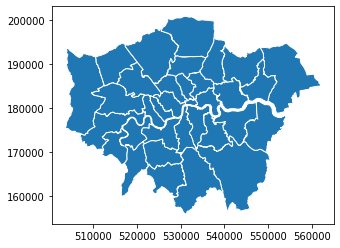

In [ ]:
#plotting london borough divisions. these are 33
lb.plot(edgecolor="white")

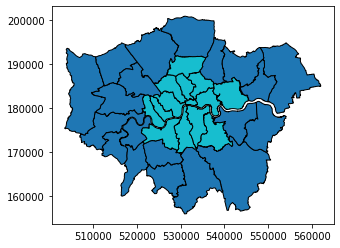

In [ ]:
lb.plot(edgecolor='black',column='ONS_INNER', facecolor='#800000')

# Combining London Price Dataset and Borough Dataset

In [ ]:
type(lhd)

geopandas.geodataframe.GeoDataFrame

In [ ]:
#making coordinate reference system(crs) of london housing same as london borough
lhd.crs=lb.crs

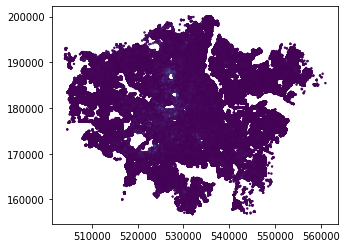

In [ ]:
#plotting london housing dataset
lhd.plot(column='price',markersize=2)

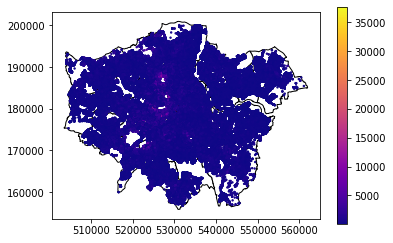

In [ ]:
#combining both plots, we are plotting housing data on top of london borough graph
base = lb.plot(facecolor='white',edgecolor='black')
lhd.plot(ax=base,column='price',markersize=2,legend=True, cmap='plasma')

In [ ]:
#putting spatial joins(sjoin) of the two datset. First argument is point dataset and 2nd is polygon
lhd2 = gpd.sjoin(lhd,lb)

In [ ]:
#creating a temporary df which is having various measures of price, tfarea and id grouped by Borough Name
lhd3 = lhd2.groupby('NAME').agg({'price':['mean','median','min','max','sum'],'tfarea':'sum','ID':'count','priceperroom':'mean'})
lhd3.columns = ['Mean_Price','Median_Price','Minimum_Price','Maximum_Price','Sum_Price','Sum_floor_area','House_Count','Average_Price_Per_Room']
lhd3 = lhd3.reset_index()
lhd3['Ave_Area_Cost'] = lhd3['Sum_Price']/lhd3['Sum_floor_area']
lhd3['Range_of_Price'] = lhd3['Maximum_Price']-lhd3['Minimum_Price']
lhd3.head()

,NAME,Mean_Price,Median_Price,Minimum_Price,Maximum_Price,Sum_Price,Sum_floor_area,House_Count,Average_Price_Per_Room,Ave_Area_Cost,Range_of_Price
0,Barking and Dagenham,248.635965,242.0,45.00,695.0,3.247932e+06,1.000330e+06,13063,65.313766,3.246859,650.00
1,Barnet,559.833086,440.0,26.32,13750.0,1.532039e+07,2.725875e+06,27366,120.002722,5.620357,13723.68
2,Bexley,302.757038,285.0,30.00,1850.0,7.325812e+06,2.053089e+06,24197,70.757431,3.568191,1820.00
3,Brent,534.579126,425.0,54.00,5499.0,6.486583e+06,1.143833e+06,12134,122.363606,5.670919,5445.00
4,Bromley,422.159345,365.0,27.00,5089.0,1.602137e+07,3.701620e+06,37951,92.861424,4.328205,5062.00


In [ ]:
#merging temporary dataset with london borough dataset
lb2 = lb.merge(lhd3)
lb2.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,ONS_INNER,SUB_2009,SUB_2006,geometry,Mean_Price,Median_Price,Minimum_Price,Maximum_Price,Sum_Price,Sum_floor_area,House_Count,Average_Price_Per_Room,Ave_Area_Cost,Range_of_Price
0,Kingston upon Thames,E09000021,3726.117,0.000,F,None,None,"MULTIPOLYGON (((516400.440 160208.103, 516406....",476.696308,400.0,48.75,6650.0,8.486624e+06,1.591593e+06,17803,111.079531,5.332158,6601.25
1,Croydon,E09000008,8649.441,0.000,F,None,None,"MULTIPOLYGON (((535007.659 159511.086, 535003....",361.098038,325.0,27.50,3250.0,7.546949e+06,1.945541e+06,20900,83.292446,3.879101,3222.50
2,Bromley,E09000006,15013.487,0.000,F,None,None,"MULTIPOLYGON (((540371.955 157536.846, 540359....",422.159345,365.0,27.00,5089.0,1.602137e+07,3.701620e+06,37951,92.861424,4.328205,5062.00
3,Hounslow,E09000018,5658.541,60.755,F,None,None,"MULTIPOLYGON (((521974.460 178105.954, 521966....",437.177937,335.0,25.00,6850.0,7.565364e+06,1.439871e+06,17305,105.667621,5.254196,6825.00
4,Ealing,E09000009,5554.428,0.000,F,None,None,"MULTIPOLYGON (((510252.384 182887.413, 510248....",497.679448,405.0,23.00,5800.0,1.059311e+07,1.857220e+06,21285,117.296290,5.703743,5777.00


In [ ]:
#calculating housing density. . We multiply the value of hectares by .01 to obtain a final measure in terms of units per km2
lb2['House_Dens'] = lb2['House_Count']/(lb2['HECTARES']*.01)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2056: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


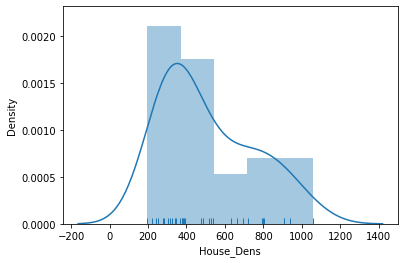

In [ ]:
#looking at the distribution of House_Dens
#right skewed that means mean is higher than median i.e. it has outliers
import seaborn
h = seaborn.distplot(lb2['House_Dens'], bins=5, rug=True)

As we can see, we have a somewhat right-skewed distribution, which means that the mean is greater than the median (i.e., a relatively small number of observations have very high values of house density, pulling the mean to the right). This will influence the way that different classification schemes reflect the underlying distribution of the data. Let's go through four of the most common classification methods: equal interval, quantile, mean-standard deviation, and Fisher-Jenks.

# Four Quantitative Data Classification methods
**Equal Intervals**

**Quantile**

**Mean-SD**

**Fisher-Jenks**

In [ ]:
!pip install mapclassify
import mapclassify
import matplotlib.pyplot as plt

In [ ]:
#using equal interval data classification
ei5 = mapclassify.EqualInterval(lb2.House_Dens, k=5)
ei5

EqualInterval             

     Interval        Count
--------------------------
[ 196.23,  369.08] |    12
( 369.08,  541.94] |    10
( 541.94,  714.79] |     3
( 714.79,  887.65] |     4
( 887.65, 1060.50] |     4

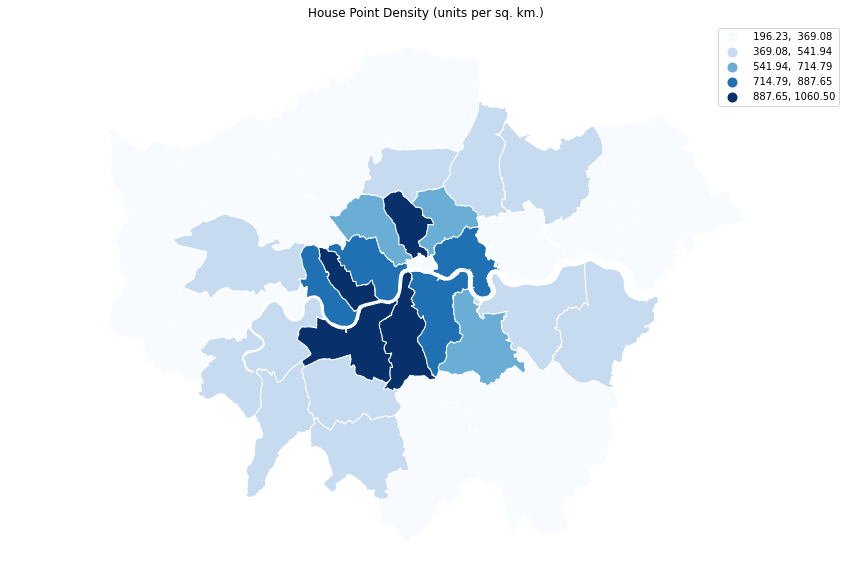

In [ ]:
#plotting for equal cllassification using blue pallete
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
lb2.plot(ax=ax, column='House_Dens', legend=True, cmap='Blues', scheme='EqualInterval', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Density (units per sq. km.)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

In [ ]:
#using quantiles for data classification
q5 = mapclassify.Quantiles(lb2.House_Dens, k=5)
q5

Quantiles                 

     Interval        Count
--------------------------
[ 196.23,  309.68] |     7
( 309.68,  378.67] |     6
( 378.67,  520.70] |     7
( 520.70,  763.67] |     6
( 763.67, 1060.50] |     7

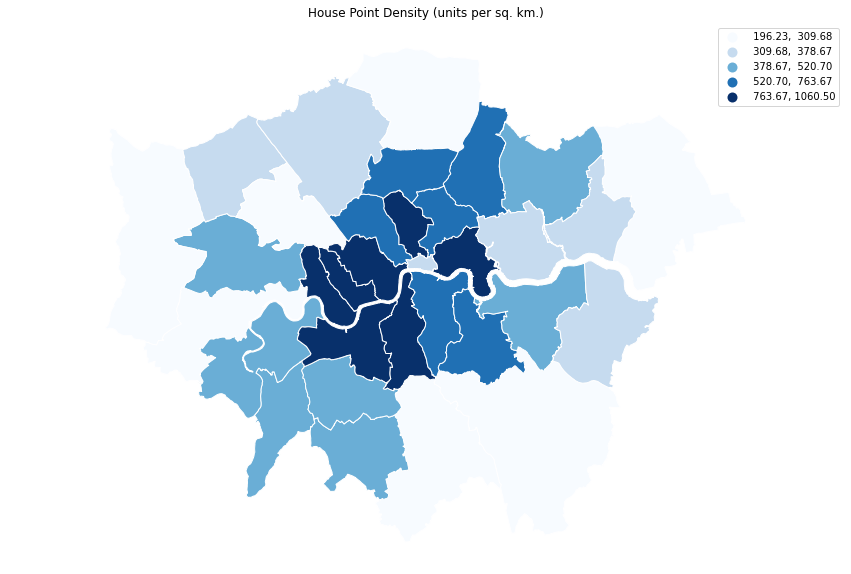

In [ ]:
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
lb2.plot(ax=ax, column='House_Dens', legend=True, cmap='Blues', scheme='Quantiles', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Density (units per sq. km.)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

In [ ]:
#using mean standard deviation
msd = mapclassify.StdMean(lb2.House_Dens)
msd

StdMean                   

     Interval        Count
--------------------------
(   -inf,   27.75] |     0
(  27.75,  269.19] |     4
( 269.19,  752.08] |    22
( 752.08,  993.52] |     6
( 993.52, 1060.50] |     1

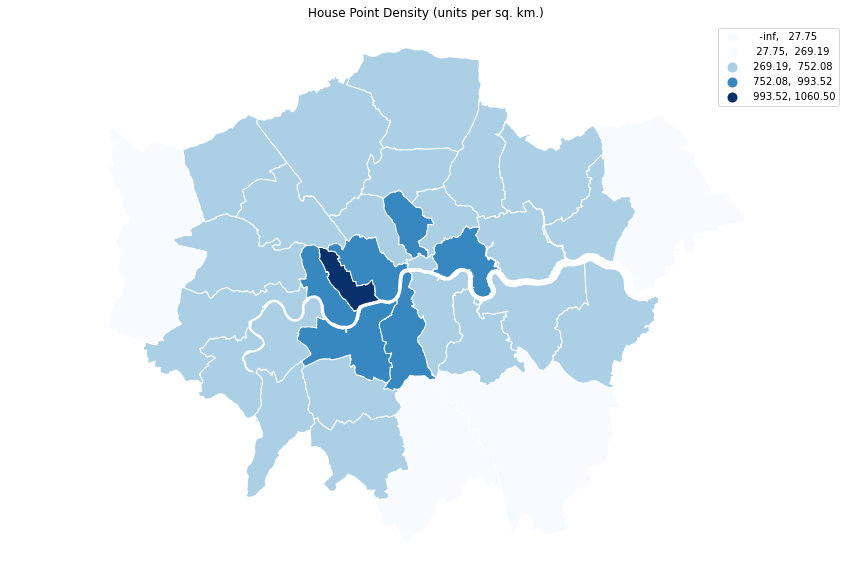

In [ ]:
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
lb2.plot(ax=ax, column='House_Dens', legend=True, cmap='Blues', scheme='StdMean', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Density (units per sq. km.)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

In [ ]:
#using fisher jenks for data classification
np.random.seed(12345) #Setting the seed ensures that any replications of the random class generation process will produce the same results.
fj5 = mapclassify.FisherJenks(lb2.House_Dens, k=5)
fj5

FisherJenks               

     Interval        Count
--------------------------
[ 196.23,  280.67] |     6
( 280.67,  389.76] |    11
( 389.76,  540.59] |     5
( 540.59,  802.60] |     7
( 802.60, 1060.50] |     4

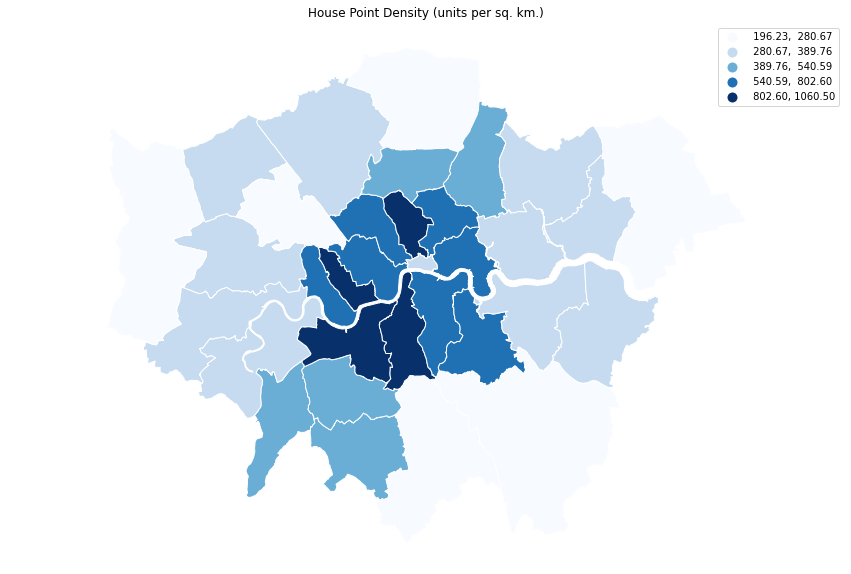

In [ ]:
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
lb2.plot(ax=ax, column='House_Dens', legend=True, cmap='Blues', scheme='FisherJenks', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Density (units per sq. km.)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

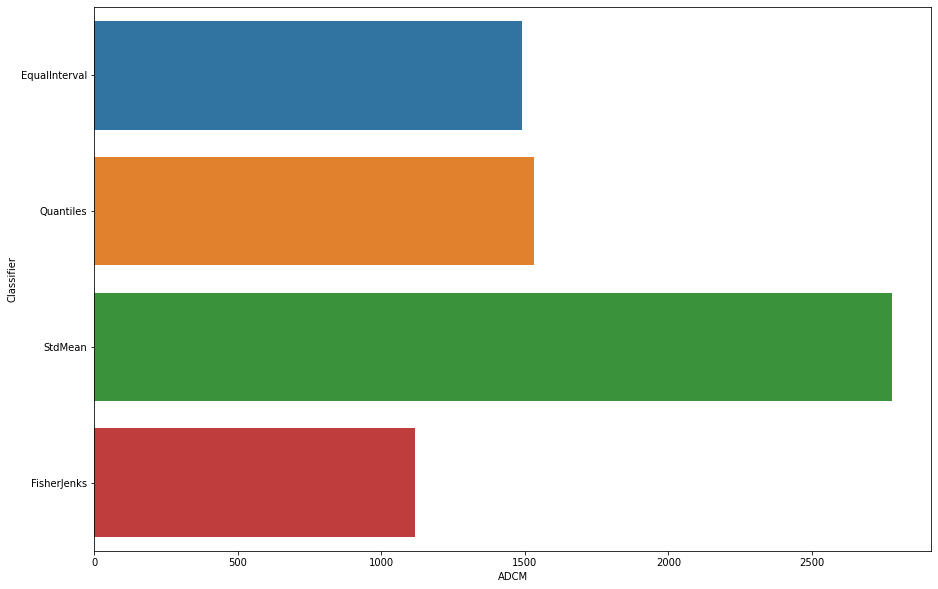

In [ ]:
#let's comapre all the 4 classification schemes
#We can explicitly compare the performance of different classification schemes in terms of ADCM(absolute deviations around class means) for a specified value of k (in this case, 5).
class5 = ei5, q5, msd, fj5
fits = np.array([ c.adcm for c in class5])
data = pd.DataFrame(fits)
data['classifier'] = [c.name for c in class5]
data.columns = ['ADCM', 'Classifier']
ax = seaborn.barplot(y='Classifier', x='ADCM', data=data) #Creates bar graph

In this case we can see that Fisher-Jenks outperforms other methods in terms of minimizing ADCM (which is encouraging, since it was designed epxlicitly to minimize this quantity). However, as discussed above, the objective of using a classification scheme may not always be to produce the minimal ADCM plot - as in the case of the mean-standard deviation scheme, we may explicitly be interested in identifying outliers in the data.

# Looking at Boroughs Graphs colored by different measures like mean, median

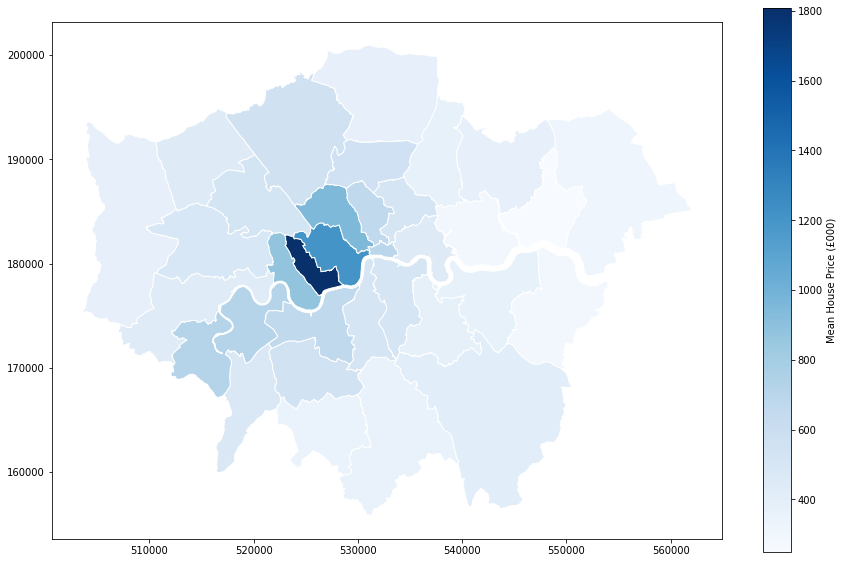

In [ ]:
#Plotting mean price for each borogh and coloring by price
lb2.plot(column='Mean_Price',cmap='Blues', legend=True,
legend_kwds={'label':'Mean House Price (£000)'},edgecolor='white')

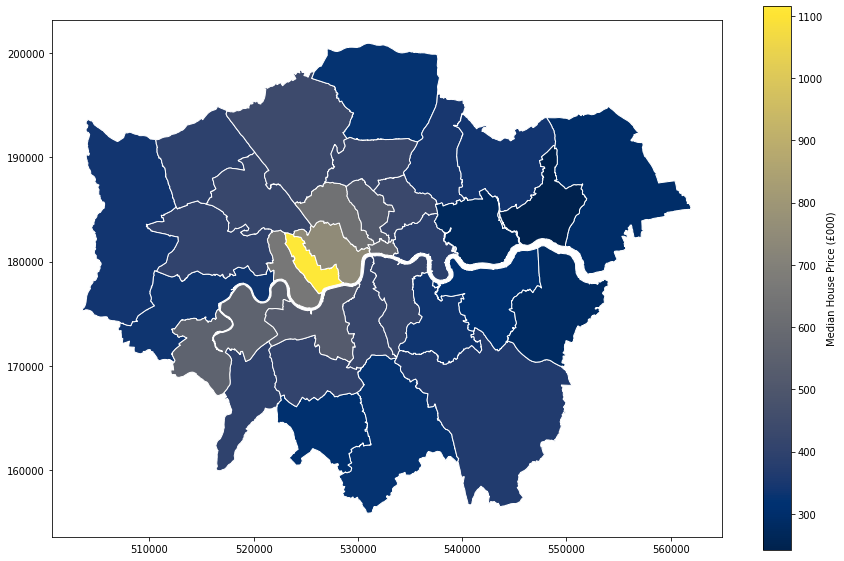

In [ ]:
#Plotting median price for each borogh and coloring by price
lb2.plot(column='Median_Price',cmap='cividis', legend=True,
legend_kwds={'label':'Median House Price (£000)'},edgecolor='white')

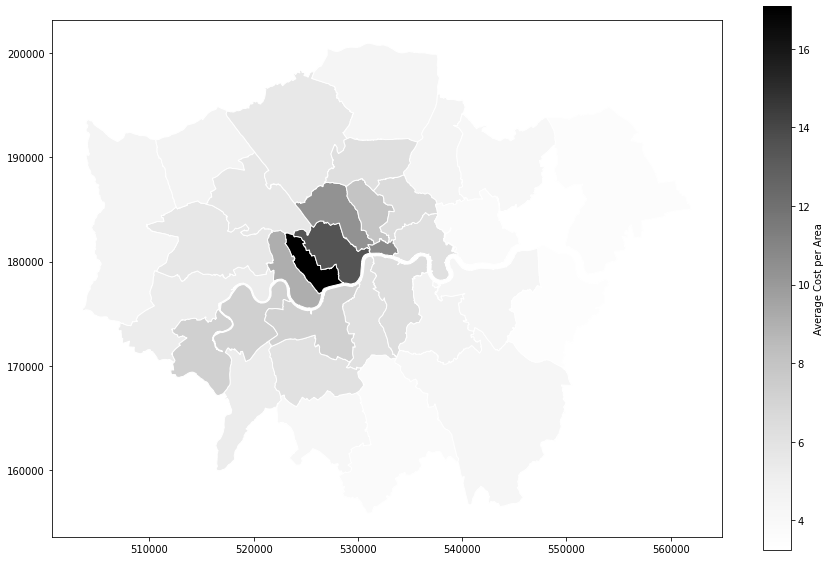

In [ ]:
#Plotting Average Area cost for each borough
lb2.plot(column='Ave_Area_Cost',cmap='Greys', legend=True,
legend_kwds={'label':'Average Cost per Area'},edgecolor='white')


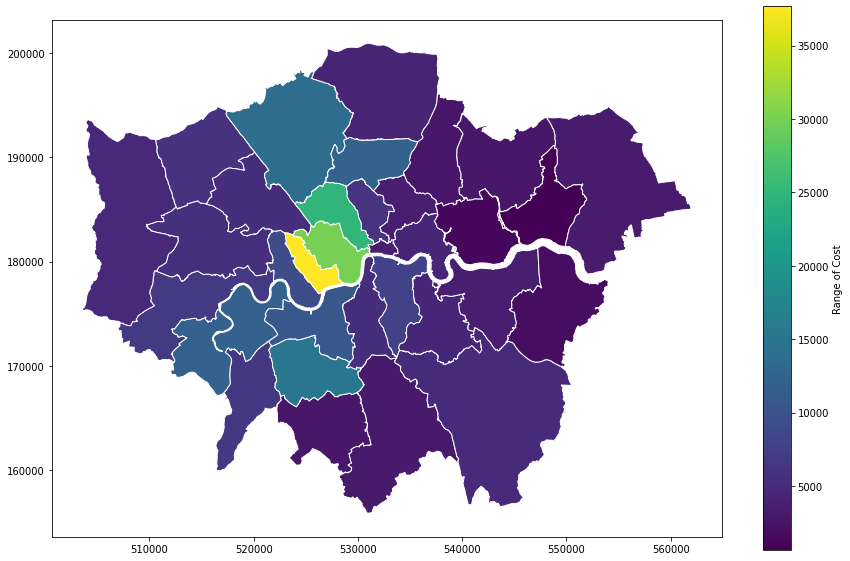

In [ ]:
#Plotting Range of Prices for each borough
lb2.plot(column='Range_of_Price',cmap='viridis', legend=True,
legend_kwds={'label':'Range of Cost'},edgecolor='white')

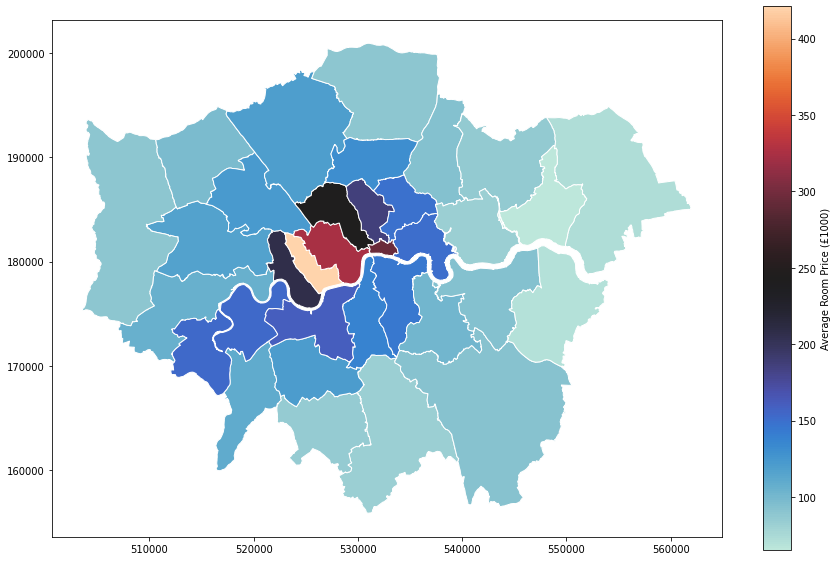

In [ ]:
#Plotting Average Price of EAch room in every borough
lb2.plot(column='Average_Price_Per_Room',cmap='icefire', legend=True,
legend_kwds={'label':'Average Room Price (£1000)'},edgecolor='white')

# Standardization

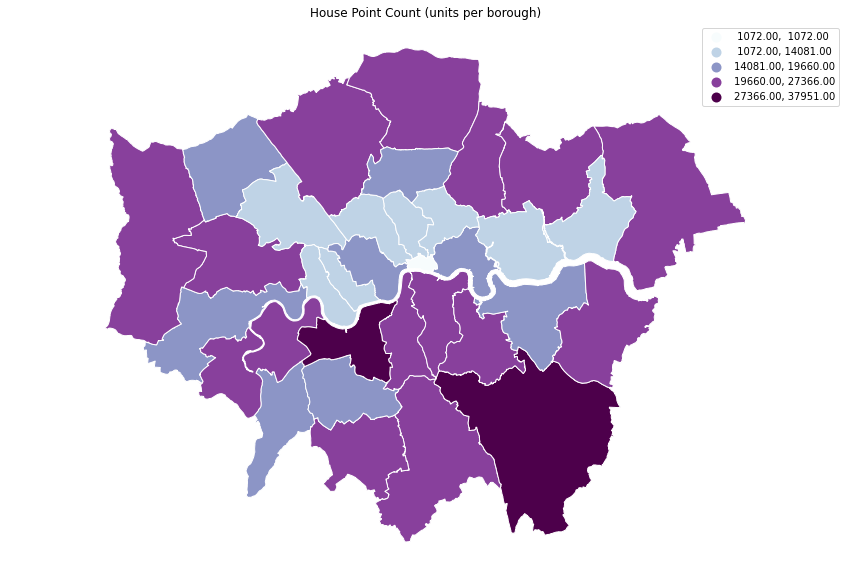

In [ ]:
#plotting house point counts for each borough
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
lb2.plot(ax=ax, column='House_Count', legend=True, cmap='BuPu', scheme='FisherJenks', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Count (units per borough)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

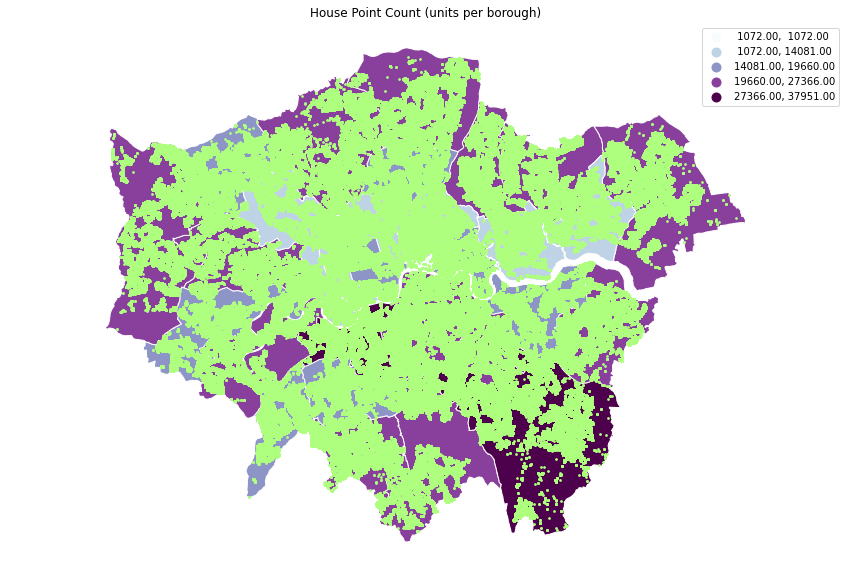

In [ ]:
#we see that above map isn't reflecting a representative depiction of house point concentration, but simply a map where the largest boroughs - which tend to be suburban due to lower population densities - are marked with the highest values.
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
lb2.plot(ax=ax, column='House_Count', legend=True, cmap='BuPu', scheme='FisherJenks', k=5, edgecolor='white')
lhd2.plot(ax=ax, color='#AFFF7F', markersize=3)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Count (units per borough)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

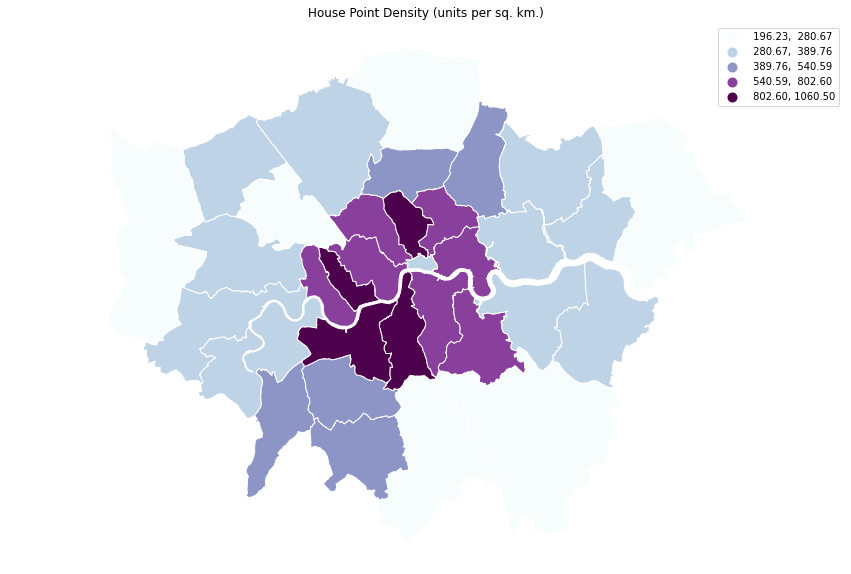

In [ ]:
#so we will use house density rather than house count to see concentration of houses in different boroughs
f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
lb2.plot(ax=ax, column='House_Dens', legend=True, cmap='BuPu', scheme='FisherJenks', k=5, edgecolor='white')
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Density (units per sq. km.)') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

# Spatial Concentration

In [ ]:
#However, if you look at the underlying pattern of points (above), 
#you may notice that there are some distinct groupings within boroughs that may be obscured even by mapping densities at the borough scale. 
#One way to get at that explicitly is to create a hexagonal grid at a smaller scale and aggregate points to it.

In [ ]:
# Import required packages
import matplotlib as mpl
from matplotlib import colors

%matplotlib inline
mpl.rcParams['figure.figsize'] = (15, 10) #this increases the inline figure size to 15 tall x 10 wide

import seaborn
import pandas as pd
import geopandas as gpd
import pysal
import numpy as np
import mapclassify
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore') # Change settings so that warnings are not displayed

In [ ]:
lhd.geometry.x

0         528925.0
1         528925.0
2         528925.0
3         528925.0
4         528925.0
            ...   
641184    522419.0
641185    524258.0
641186    522419.0
641187    522419.0
641188    522646.0
Length: 641189, dtype: float64

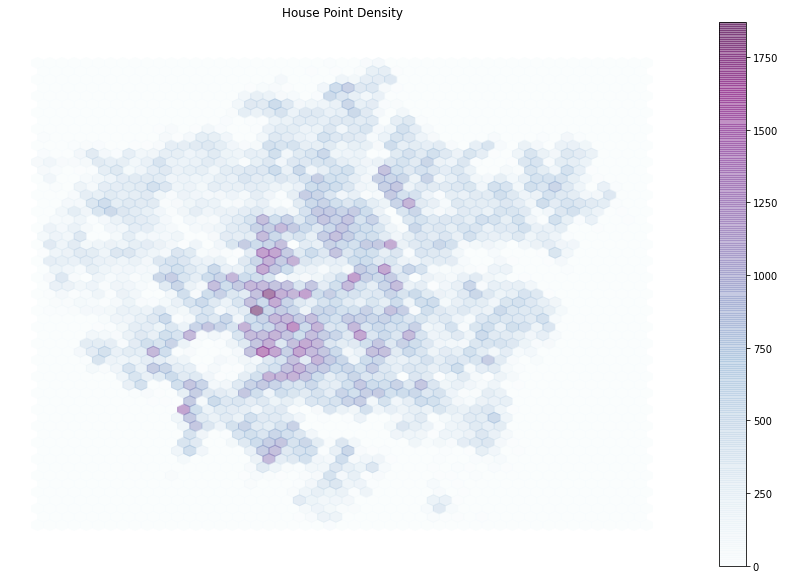

In [ ]:
f, ax = plt.subplots(1, figsize=(15, 10)) # Setup figure and axis
hb = ax.hexbin(lhd.geometry.x,lhd.geometry.y, gridsize=50, alpha=0.5, cmap='BuPu') # Add hexagon layer that displays count of points in each polygon
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Density') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.colorbar(hb) # Add a colorbar (optional)
plt.show()

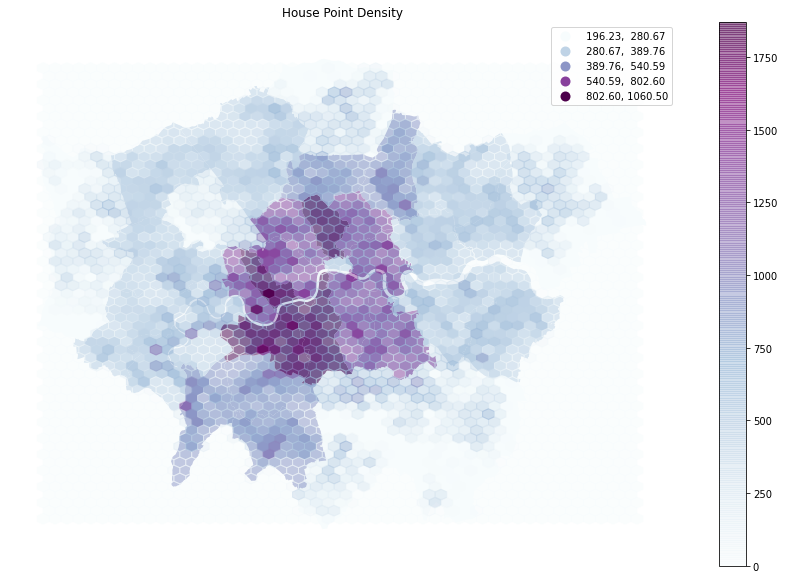

In [ ]:
f, ax = plt.subplots(1, figsize=(15, 10)) # Setup figure and axis
lb2.plot(ax=ax, column='House_Dens', legend=True, cmap='BuPu', scheme='FisherJenks', k=5)
hb = ax.hexbin(lhd.geometry.x, lhd.geometry.y, gridsize=50, alpha=0.5, cmap='BuPu') # Add hexagon layer that displays count of points in each polygon
ax.set_axis_off() #Remove axes from plot 
ax.set_title('House Point Density') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.colorbar(hb) # Add a colorbar (optional)
plt.show()

# KNN Regression on Housing Dataset

In [ ]:
#importing StandardScaler function
#SS won't do scaling itself but python object will do scaling
from sklearn.preprocessing import StandardScaler
#importing Pipeline
from sklearn.pipeline import Pipeline
x_scaler=StandardScaler()
#reason for using KNN is that since house price will be dependent on the locality and the nearby prices house so let's use that
#let's take 4 neighbors and keep weight as 'uniform' and take euclidean distance i.e. p=2 in Minnkowski distance
from sklearn.neighbors import KNeighborsRegressor as KNN
reg_object = KNN(n_neighbors=4,weights='uniform',p=2)

In [ ]:
lhd['longitude']=lhd.geometry.x
lhd['latitude']=lhd.geometry.y

In [ ]:
price=lhd['price']

In [ ]:
#creating Pipeline object
pipe = Pipeline([('zscores',StandardScaler()),
    ('NNreg',KNN(n_neighbors=4,weights='uniform',p=2))])
#fitting the pipeline
pipe.fit(lhd[['longitude','latitude','tfarea']],price)

Pipeline(memory=None,
         steps=[('zscores',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('NNreg',
                 KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                     metric='minkowski', metric_params=None,
                                     n_jobs=None, n_neighbors=4, p=2,
                                     weights='uniform'))],
         verbose=False)

In [ ]:
from sklearn.model_selection import GridSearchCV
#tuning the parameters so let's import evalutation metrics package and CV package
from sklearn.metrics import mean_absolute_error, make_scorer
#let's initialise mae object and gretr_is_better is FALSE tells that lower score is better
mae = make_scorer(mean_absolute_error, greater_is_better=False)

In [ ]:
#creating pipeline of zscores and KNN to find best parameters
pipe = Pipeline([('zscores',StandardScaler()),('NNreg',KNN())])
#giving pipeline as input in estimator of GRid serach CV
opt_nn2 = GridSearchCV(
    estimator = pipe,
    scoring = mae,
    param_grid = {
        'NNreg__n_neighbors':range(1,35),
        'NNreg__weights':['uniform','distance'],
        'NNreg__p':[1,2]})

In [ ]:
#fitting using created pipeline
from sklearn.neighbors import KNeighborsRegressor as NN
reg_object = NN(n_neighbors=11,weights='distance',p=1)
reg_object.fit(lhd[['longitude','latitude','tfarea']],price)
#11 Minkowski p : 1 Weighting : distance MAE Score : 9.30

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=11, p=1,
                    weights='distance')

In [ ]:
#writing a function to get neater o/p of best paramters
def print_summary2(opt_pipe_object):
    params = opt_pipe_object.best_estimator_.get_params()
    score = - opt_pipe_object.best_score_
    print("Nearest neighbours: %8d" % params['NNreg__n_neighbors'])
    print("Minkowski p       : %8d" % params['NNreg__p'])
    print("Weighting         : %8s" % params['NNreg__weights'])
    print("MAE Score         : %8.2f" % score)
    return

In [ ]:
print_summary2(opt_nn2)

In [ ]:
#Visualising the Outcome
## Let's get geographical grid using numpy and mesh grid to visualise outcome
east_mesh, north_mesh = np.meshgrid(
    np.linspace(505000,555800,100),
    np.linspace(158400,199900,100))
#creating a zero mesh of 100*100 for florr area
fl_mesh = np.zeros_like(east_mesh)
#initialisng fl_mesh with mean_values
fl_mesh[:,:] = np.mean(lhd['tfarea'])

In [ ]:
#converting 2D arrays to single dimensional array as KNN doesn't accept 2D arrays
grid_predictor_vars = np.array([east_mesh.ravel(),
    north_mesh.ravel(),fl_mesh.ravel()]).T 

In [ ]:
#making prediction 
df_pred = reg_object.predict(grid_predictor_vars)
#let's get predictions back in grid format so that we can plot them
df_mesh = df_pred.reshape(east_mesh.shape)

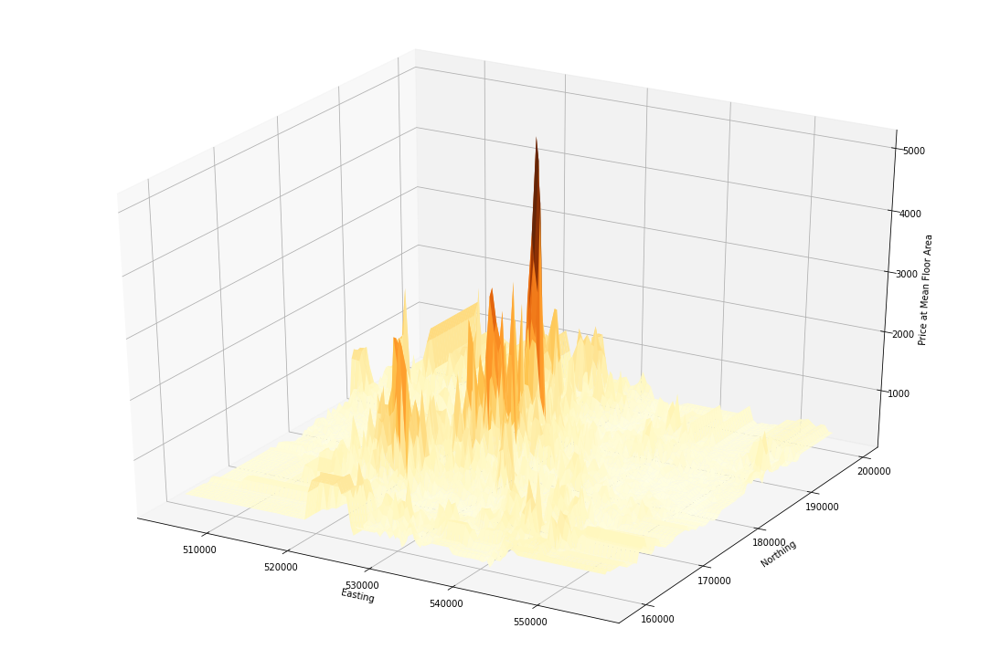

In [ ]:
#plotting the graph
import pylab as pl
from mpl_toolkits.mplot3d import Axes3D

fig = pl.figure()
ax = Axes3D(fig)
ax.plot_surface(east_mesh, north_mesh, df_mesh, rstride=1, cstride=1, cmap='YlOrBr',lw=0.01)
ax.set_xlabel('Easting')
ax.set_ylabel('Northing')
ax.set_zlabel('Price at Mean Floor Area')
pl.show()

#ESDA using PySAL

In [ ]:
!pip install pysal
!pip install contextily

     |████████████████████████████████| 2.4MB 30.6MB/s 
     |████████████████████████████████| 112kB 41.1MB/s 
     |████████████████████████████████| 61kB 7.0MB/s 
     |████████████████████████████████| 61kB 6.8MB/s 
     |████████████████████████████████| 92kB 9.6MB/s 
     |████████████████████████████████| 51kB 6.5MB/s 
     |████████████████████████████████| 51kB 6.7MB/s 
     |████████████████████████████████| 215kB 42.1MB/s 
     |████████████████████████████████| 5.7MB 40.9MB/s 
     |████████████████████████████████| 61kB 7.2MB/s 
     |████████████████████████████████| 153kB 40.9MB/s 
     |████████████████████████████████| 235kB 42.7MB/s 
     |████████████████████████████████| 235kB 35.3MB/s 
     |████████████████████████████████| 57.4MB 1.4MB/s 
     |████████████████████████████████| 19.1MB 252kB/s 
     |████████████████████████████████| 40.6MB 110kB/s 
     |████████████████████████████████| 133kB 43.1MB/s 
  Created wheel for pysal: filename=pysal-2.4.0-cp37-none-an

     |████████████████████████████████| 133kB 34.7MB/s 
ERROR: pysal 2.4.0 has requirement urllib3>=1.26, but you'll have urllib3 1.25.11 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: urllib3 1.26.4
    Uninstalling urllib3-1.26.4:
      Successfully uninstalled urllib3-1.26.4


In [ ]:
# Import required packages
import matplotlib as mpl
from matplotlib import colors

%matplotlib inline
mpl.rcParams['figure.figsize'] = (15, 10) #this increases the inline figure size to 15 tall x 10 wide

import seaborn
import pandas as pd
import geopandas as gpd
import pysal
import numpy as np
import mapclassify
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore') # Change settings so that warnings are not displayed

# Loading a few new packages
import contextily as cx
from shapely.geometry import Polygon
import plotly.express as px
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import plot_moran
from splot.esda import moran_scatterplot
from splot.esda import plot_local_autocorrelation
from splot.esda import lisa_cluster
from esda.moran import Moran_Local

In [ ]:
lhd['year'].value_counts()

2014.0    90686
2013.0    85556
2015.0    83172
2012.0    73103
2011.0    71733
2016.0    70925
2017.0    63501
2018.0    59599
2019.0    42914
Name: year, dtype: int64

In [ ]:
lhd11 = lhd[(lhd["year"]==2011)]

In [ ]:
sum(lhd11['year']==2011)

71733

In [ ]:
#lhd11.total_bounds shows the min and max of x and y axis i.e. latitude and longitude
xmin,ymin,xmax,ymax =  lhd11.total_bounds
length = 800
wide = 800

cols = list(np.arange(xmin, xmax + wide, wide))
rows = list(np.arange(ymin, ymax + length, length))

polygons = []
for x in cols[:-1]:
    for y in rows[:-1]:
        polygons.append(Polygon([(x,y), (x+wide, y), (x+wide, y+length), (x, y+length)]))

grid = gpd.GeoDataFrame({'geometry':polygons})

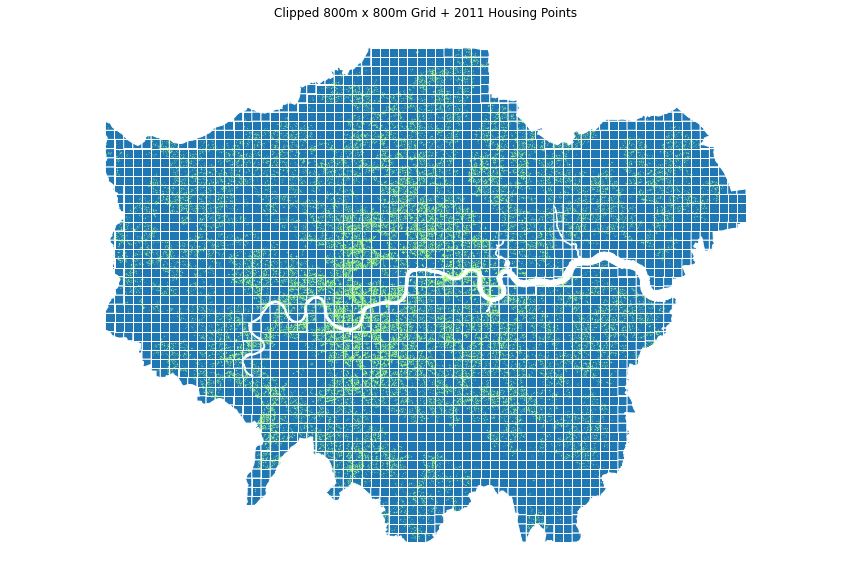

In [ ]:
lb = gpd.read_file('london_boroughs.geojson')
grid_clip = gpd.clip(grid, lb) #Clip the grid to the extent of the London boroughs GeoJSON

f, ax = plt.subplots(1, figsize=(15, 10)) #Subplots allows you to draw multiple plots in one figure
grid_clip.plot(ax=ax, legend=False, edgecolor='white')
lhd11.plot(ax=ax, color='#AFFF7F', markersize=.05, alpha=.5)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('Clipped 800m x 800m Grid + 2011 Housing Points') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
plt.show()

In [ ]:
grid_clip['ID2'] = grid_clip.index+1
hp2 = gpd.sjoin(lhd11,grid_clip)
hp3 = hp2.groupby('ID2').agg({'priceper':'median','ID':'count'})
hp3.columns = ['Median_Price_Per_Area','House_Count']
hp3 = hp3.reset_index()

In [ ]:
grid_clip2 = grid_clip.merge(hp3, how='outer')
grid_clip2['Median_Price_Per_Area'] = grid_clip2['Median_Price_Per_Area'].fillna(0) #Fill median house price NAs w/0
grid_clip2['House_Count'] = grid_clip2['House_Count'].fillna(0) #Fill house count NAs w/0

In [ ]:
grid_clip2 = grid_clip2.set_crs(epsg=27700)
grid_clip2.to_crs(epsg=4326)

,geometry,ID2,Median_Price_Per_Area,House_Count
0,"POLYGON ((-0.49159 51.46276, -0.49199 51.46289...",23,0.000000,0.0
1,"POLYGON ((-0.50246 51.47379, -0.49095 51.47364...",24,0.000000,0.0
2,"POLYGON ((-0.50222 51.48098, -0.49071 51.48083...",25,0.000000,0.0
3,"POLYGON ((-0.50217 51.48269, -0.50199 51.48291...",26,0.000000,0.0
4,"POLYGON ((-0.49924 51.48822, -0.49920 51.48846...",27,0.000000,0.0
...,...,...,...,...
2626,"POLYGON ((0.29573 51.54002, 0.30726 51.53979, ...",3761,0.000000,0.0
2627,"POLYGON ((0.29609 51.54720, 0.30762 51.54698, ...",3762,2.930358,1.0
2628,"POLYGON ((0.29645 51.55439, 0.30798 51.55417, ...",3763,0.000000,0.0
2629,"POLYGON ((0.29682 51.56158, 0.30835 51.56135, ...",3764,0.000000,0.0


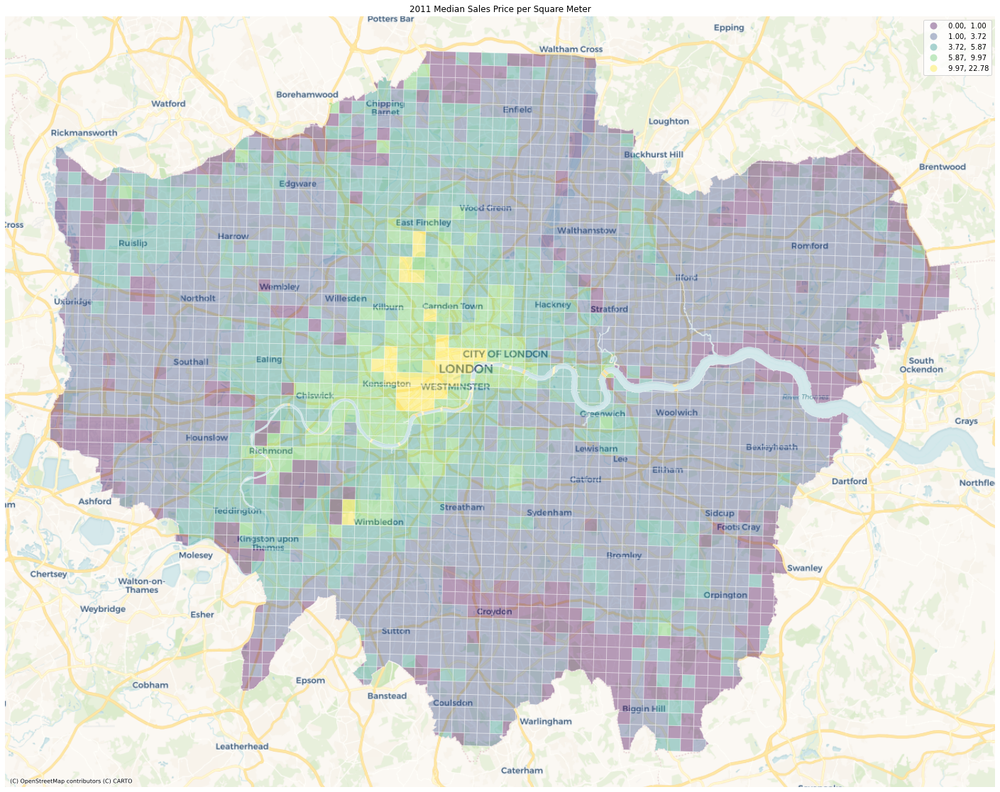

In [ ]:
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
grid_clip2.to_crs('EPSG:3857').plot(ax=ax, column='Median_Price_Per_Area', cmap='viridis', legend=True, scheme='FisherJenks', k=5, edgecolor='white', alpha=.38)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('2011 Median Sales Price per Square Meter') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

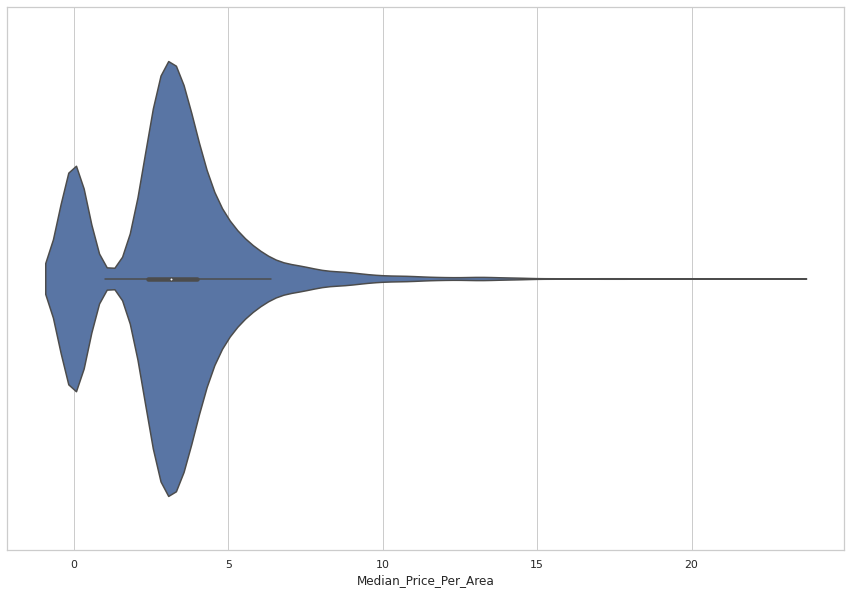

In [ ]:
seaborn.set_theme(style="whitegrid")
bx = seaborn.violinplot(x=grid_clip2["Median_Price_Per_Area"])

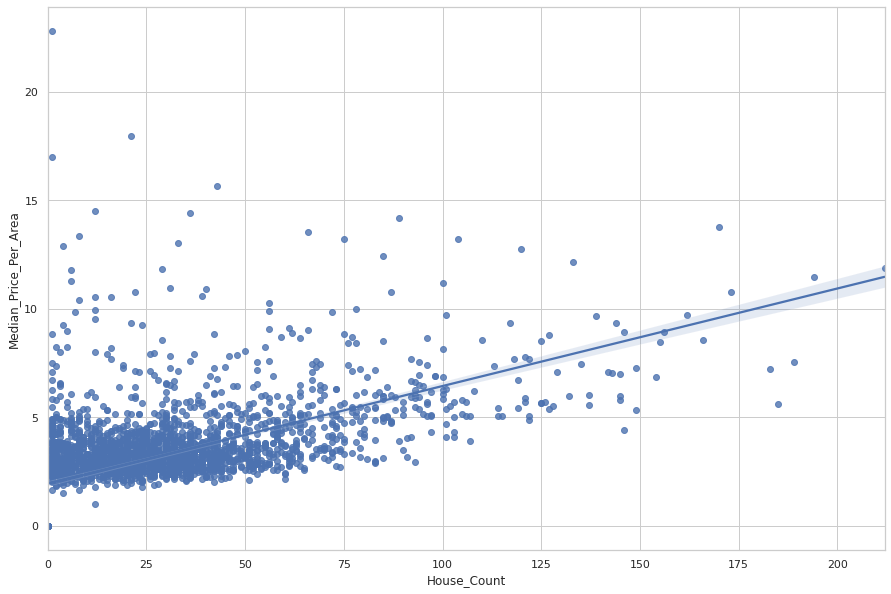

In [ ]:
seaborn.regplot(data=grid_clip2, x="House_Count", y="Median_Price_Per_Area")

In [ ]:
grid_clip2['V_High'] = (grid_clip2['Median_Price_Per_Area'] > 12000).astype(int)
fig = px.parallel_coordinates(grid_clip2, color="V_High",
                             dimensions=['V_High', 'Median_Price_Per_Area', 'House_Count'])
fig.show()

# Global Spatial Autocorrelation

In [ ]:
# Generate W from the GeoDataFrame
w = weights.Queen.from_dataframe(grid_clip2)
# Row-standardization
w.transform = 'R'

### Spatial Lag

In [ ]:
grid_clip2['Median_Price_Per_Area_Lag'] = weights.spatial_lag.lag_spatial(w, grid_clip2['Median_Price_Per_Area'])

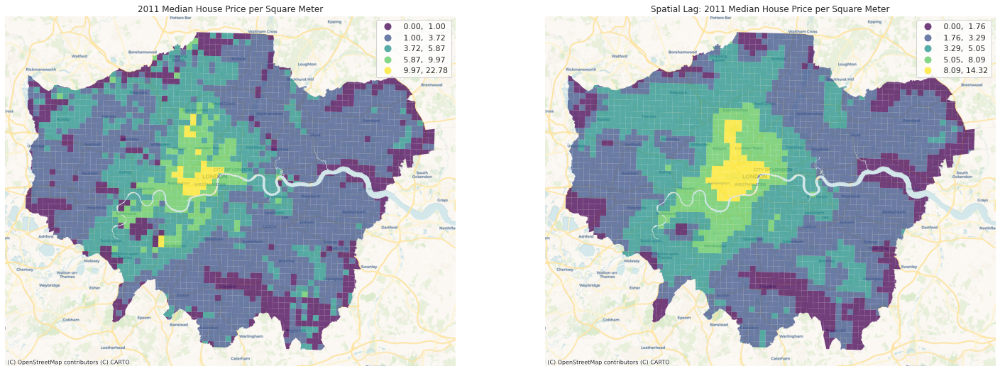

In [ ]:
f, axs = plt.subplots(1, 2, figsize=(25, 20))
ax1, ax2 = axs

grid_clip2.to_crs('EPSG:3857').plot(column='Median_Price_Per_Area', cmap='viridis', scheme='FisherJenks',
        k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax1)
ax1.set_axis_off()
ax1.set_title("2011 Median House Price per Square Meter")
cx.add_basemap(ax1, source=cx.providers.CartoDB.Voyager)

grid_clip2.to_crs('EPSG:3857').plot(column='Median_Price_Per_Area_Lag', cmap='viridis', scheme='FisherJenks',
        k=5, edgecolor='white', linewidth=0., alpha=0.75, legend=True, ax=ax2)
ax2.set_axis_off()
ax2.set_title("Spatial Lag: 2011 Median House Price per Square Meter")
cx.add_basemap(ax2, source=cx.providers.CartoDB.Voyager)

### Joint Count

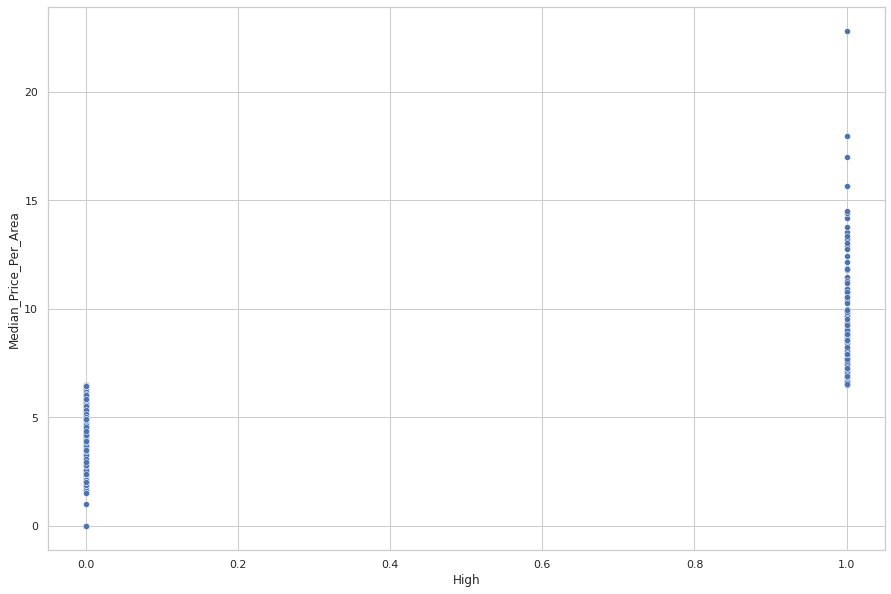

In [ ]:
grid_clip2['High'] = (grid_clip2['Median_Price_Per_Area'] > 6.5).astype(int)
seaborn.scatterplot(data=grid_clip2, x="High", y="Median_Price_Per_Area")

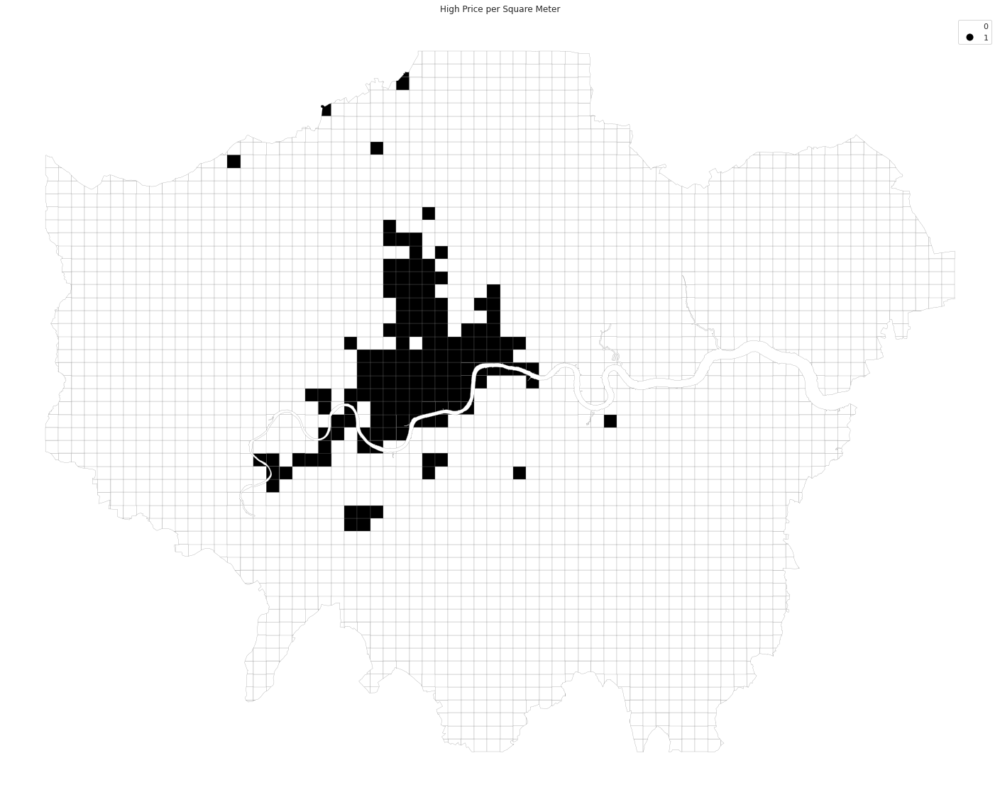

In [ ]:
f, ax = plt.subplots(1, figsize=(25, 20))
grid_clip2.plot(ax=ax, column='High', categorical=True, legend=True, 
        edgecolor='0.5', linewidth=0.25, cmap='Greys');
ax.set_axis_off()
ax.set_title('High Price per Square Meter')
plt.axis('equal')
plt.show()

In [ ]:
w.transform = 'O' #Transform weights matrix back to non-standardized state in order to sum total counts
jc = esda.join_counts.Join_Counts(grid_clip2['High'], w)

In [ ]:
jc.bb

378.0

In [ ]:
jc.ww

9154.0

In [ ]:
jc.bw

400.0

In [ ]:
jc.bb+jc.ww+jc.bw

9932.0

In [ ]:
jc.mean_bb

31.683683683683682

In [ ]:
jc.mean_bw

1061.1751751751751

In [ ]:
jc.p_sim_bb

0.001

# Global MOran's I

In [ ]:
grid_clip2['MP_std'] = ( grid_clip2['Median_Price_Per_Area'] - grid_clip2['Median_Price_Per_Area'].mean() )\
                    / grid_clip2['Median_Price_Per_Area'].std()
grid_clip2['MP_lag_std'] = ( grid_clip2['Median_Price_Per_Area_Lag'] - grid_clip2['Median_Price_Per_Area_Lag'].mean() )\
                    / grid_clip2['Median_Price_Per_Area_Lag'].std()

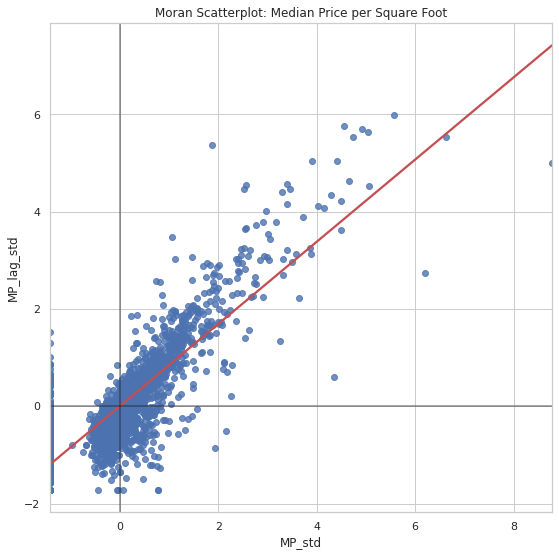

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))

seaborn.regplot(x='MP_std', y='MP_lag_std', 
                ci=None, data=grid_clip2, line_kws={'color':'r'})
ax.axvline(0, c='k', alpha=0.5)
ax.axhline(0, c='k', alpha=0.5)
ax.set_title('Moran Scatterplot: Median Price per Square Foot')
plt.show()

In [ ]:
w.transform = 'R'
moran = esda.Moran(grid_clip2['Median_Price_Per_Area'], w)
moran.I

0.7033852342273359

In [ ]:
moran.p_sim

0.001

(-0.25, 0.75)

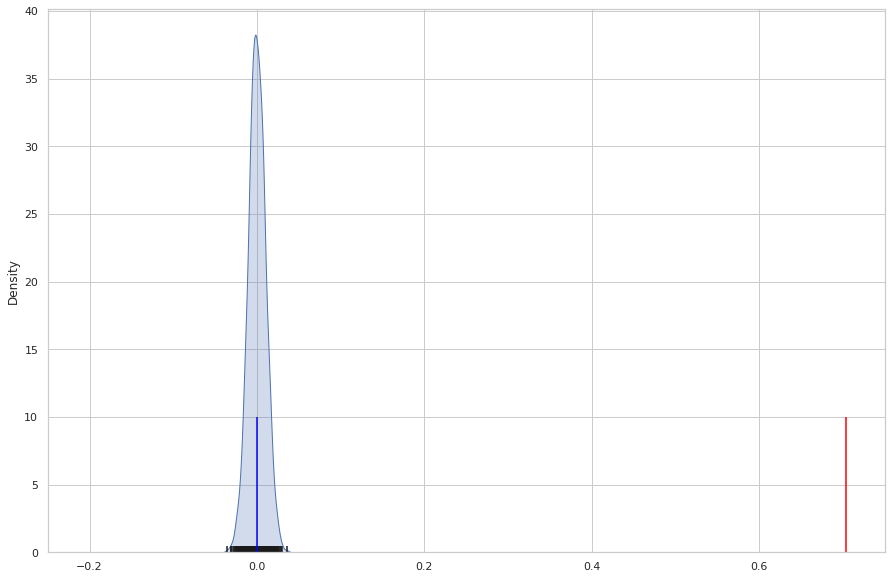

In [ ]:
seaborn.kdeplot(moran.sim, shade=True)
plt.vlines(moran.sim, 0, 0.5)
plt.vlines(moran.I, 0, 10, 'red')
plt.vlines(moran.EI, 0, 10, 'blue') #Expected value of I
plt.xlim([-0.25, 0.75])

# LISA

In [ ]:
moran_loc = Moran_Local(grid_clip2['Median_Price_Per_Area'], w, permutations=9999)

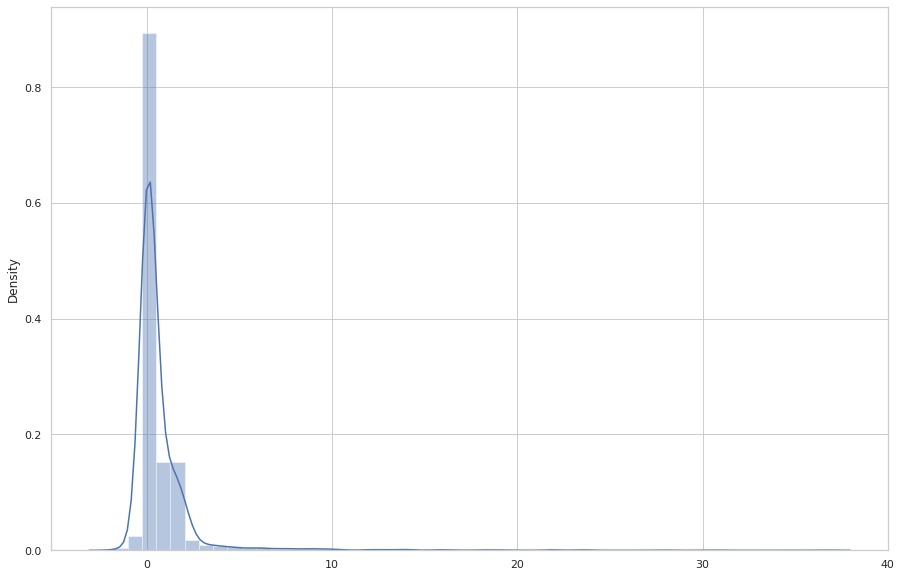

In [ ]:
seaborn.distplot(moran_loc.Is)

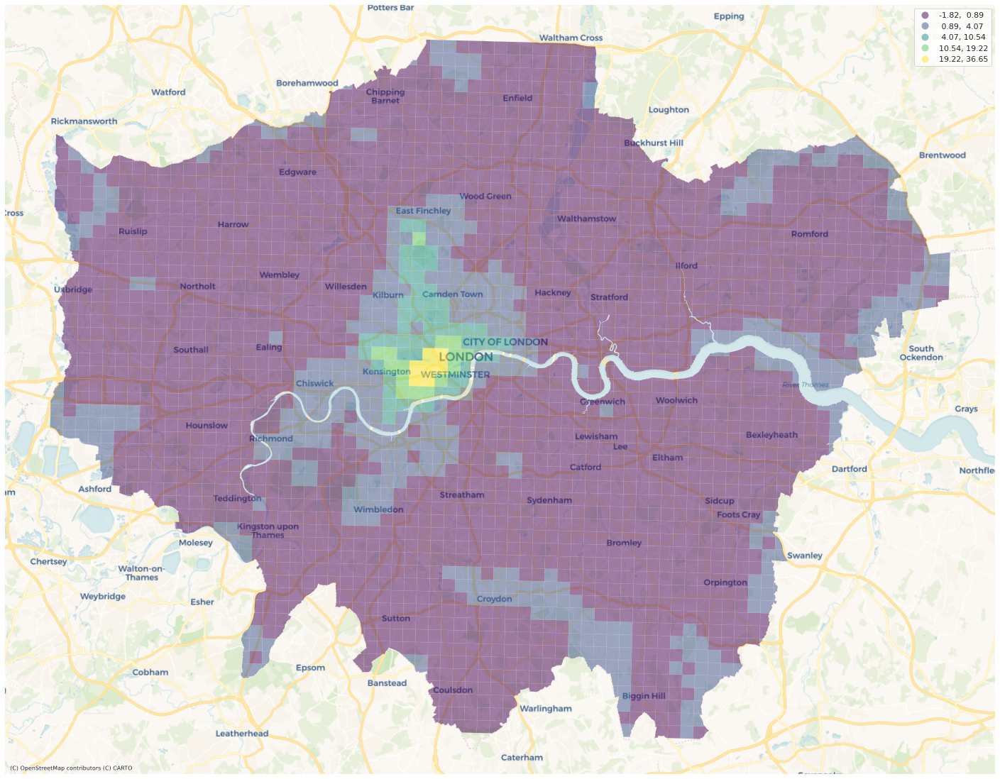

In [ ]:
grid_clip2['Is'] = moran_loc.Is
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
grid_clip2.to_crs('EPSG:3857').plot(column='Is', cmap='viridis', scheme='FisherJenks',
        k=5, edgecolor='white', linewidth=0.1, alpha=0.5, legend=True,ax=ax);
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)
ax.set_axis_off()

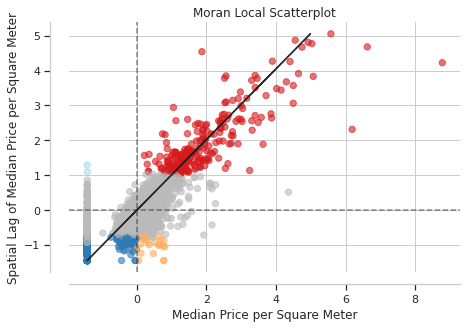

In [ ]:
f, ax = moran_scatterplot(moran_loc, p=0.01)
ax.set_xlabel('Median Price per Square Meter')
ax.set_ylabel('Spatial Lag of Median Price per Square Meter')
plt.show()

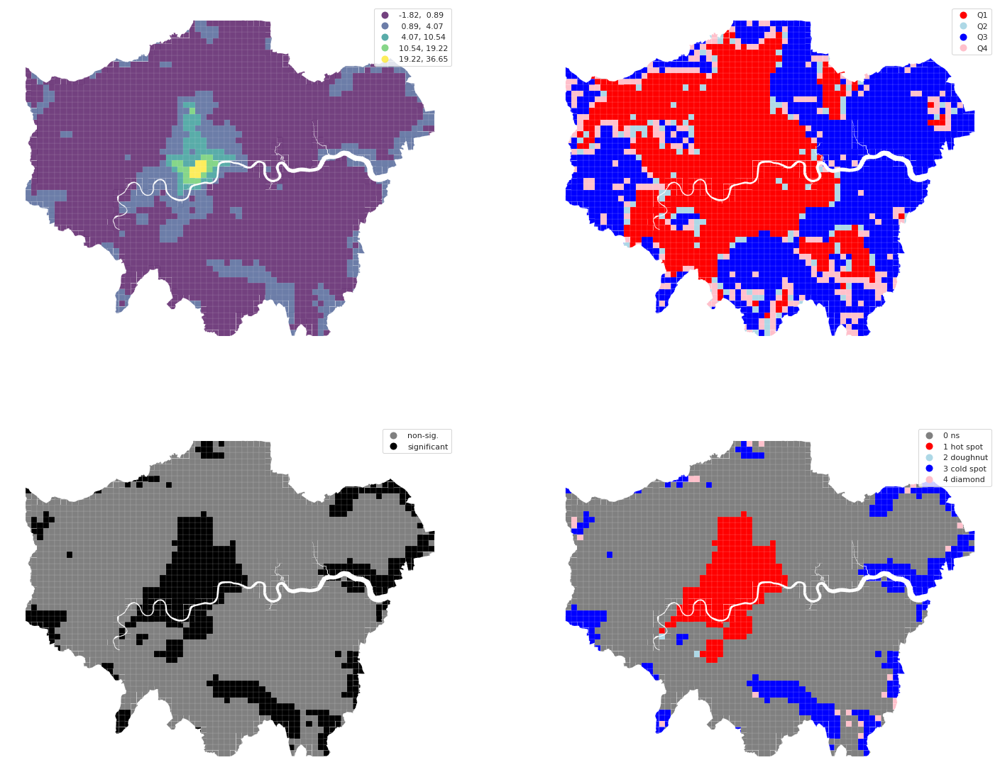

In [ ]:
# Set up figure and axes
f, axs = plt.subplots(nrows=2, ncols=2, figsize=(25, 20))
# Make the axes accessible with single indexing
axs = axs.flatten()

                    # Subplot 1 #
ax = axs[0]
grid_clip2.plot(column='Is', cmap='viridis', scheme='FisherJenks',
        k=5, edgecolor='white', linewidth=0.1, alpha=0.75, legend=True, ax=ax)
ax.set_aspect('equal')
ax.set_axis_off()

                    # Subplot 2 #
ax = axs[1]
q_labels = ['Q1', 'Q2', 'Q3', 'Q4']
labels = [q_labels[i-1] for i in moran_loc.q]
hmap = colors.ListedColormap([ 'red', 'lightblue', 'blue', 'pink'])
grid_clip2.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)

ax.set_aspect('equal')
ax.set_axis_off()

                    # Subplot 3 #

ax = axs[2]
sig = 1 * (moran_loc.p_sim < 0.01)
hmap = colors.ListedColormap(['grey','black'])
labels = ['non-sig.', 'significant'] 
labels = [labels[i] for i in sig]
grid_clip2.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)

ax.set_aspect('equal')
ax.set_axis_off()
                            
                    # Subplot 4 #
ax = axs[3]
hotspot = 1 * (sig * moran_loc.q==1)
coldspot = 3 * (sig * moran_loc.q==3)
doughnut = 2 * (sig * moran_loc.q==2)
diamond = 4 * (sig * moran_loc.q==4)
spots = hotspot + coldspot + doughnut + diamond
spot_labels = [ '0 ns', '1 hot spot', '2 doughnut', '3 cold spot', '4 diamond']
labels = [spot_labels[i] for i in spots]
hmap = colors.ListedColormap([ 'grey', 'red', 'lightblue', 'blue', 'pink'])


grid_clip2.assign(cl=labels).plot(column='cl', categorical=True, \
        k=2, cmap=hmap, linewidth=0.1, ax=ax, \
        edgecolor='white', legend=True)

ax.set_aspect('equal')
ax.set_axis_off()

# Display the figure
plt.show()

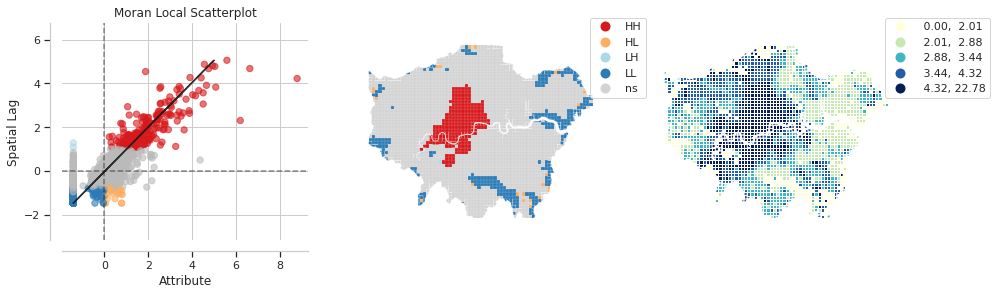

In [ ]:
plot_local_autocorrelation(moran_loc, grid_clip2, 'Median_Price_Per_Area', p=0.01)
plt.show()

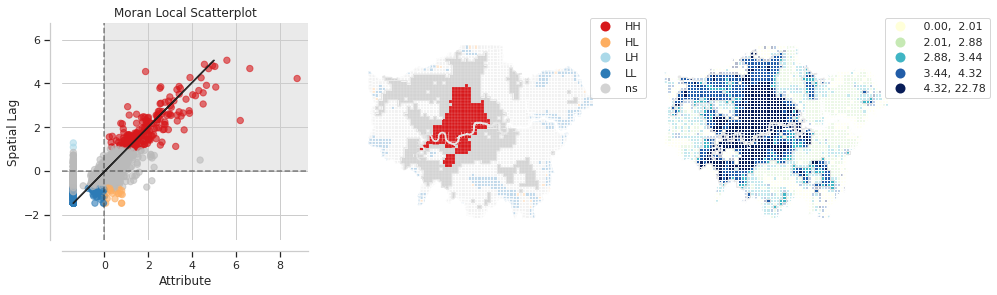

In [ ]:
plot_local_autocorrelation(moran_loc, grid_clip2, 'Median_Price_Per_Area', p=0.01, quadrant=1)
plt.show()

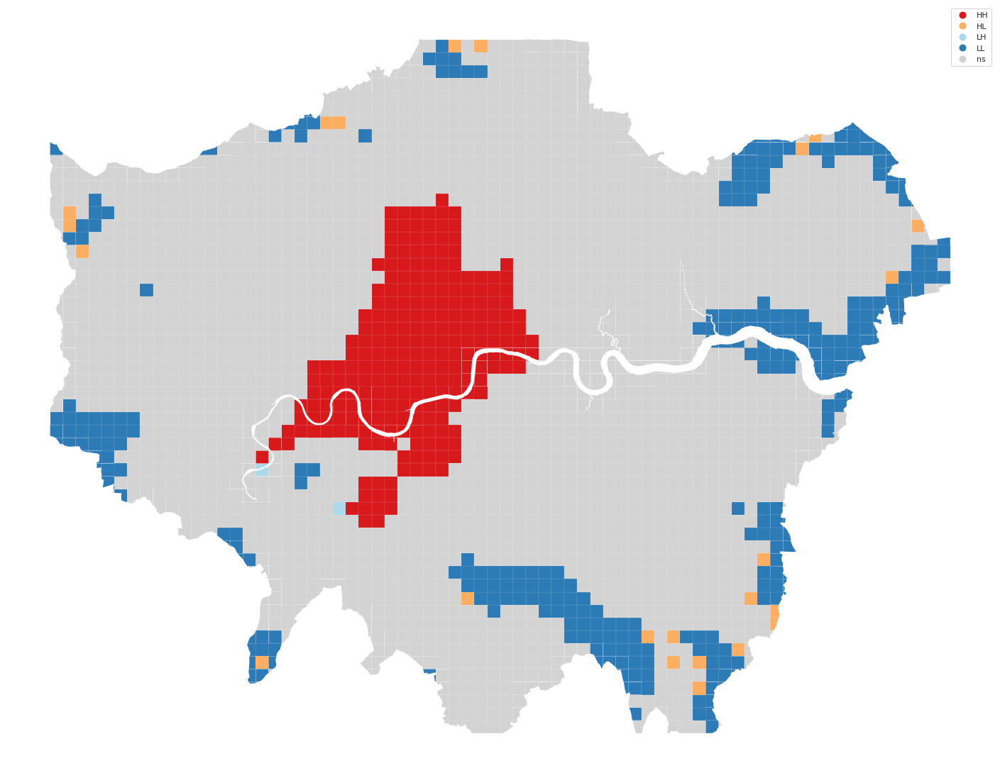

In [ ]:
lisa_cluster(moran_loc, grid_clip2, p=0.01, figsize = (25,20))
plt.show()

## Changing p-value for Moran's I (0.05)

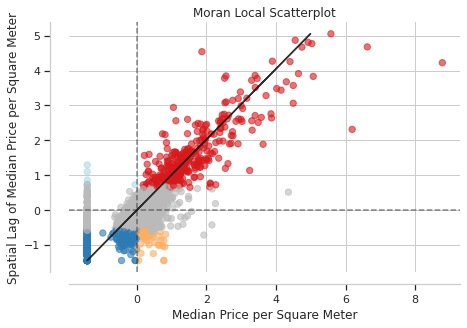

In [ ]:
f, ax = moran_scatterplot(moran_loc, p=0.05)
ax.set_xlabel('Median Price per Square Meter')
ax.set_ylabel('Spatial Lag of Median Price per Square Meter')
plt.show()

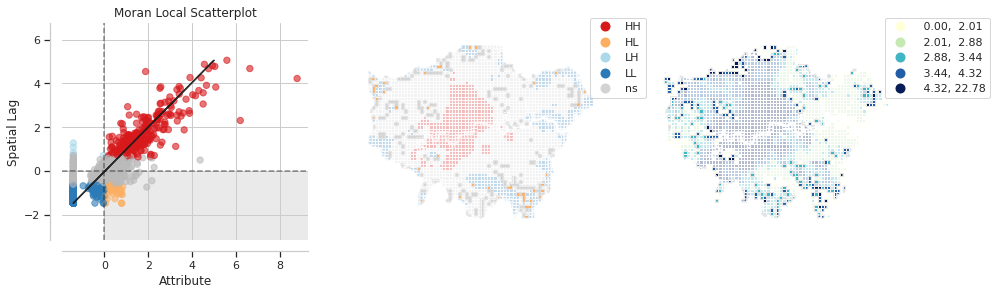

In [ ]:
plot_local_autocorrelation(moran_loc, grid_clip2, 'Median_Price_Per_Area', p=0.05,quadrant=4)
plt.show()

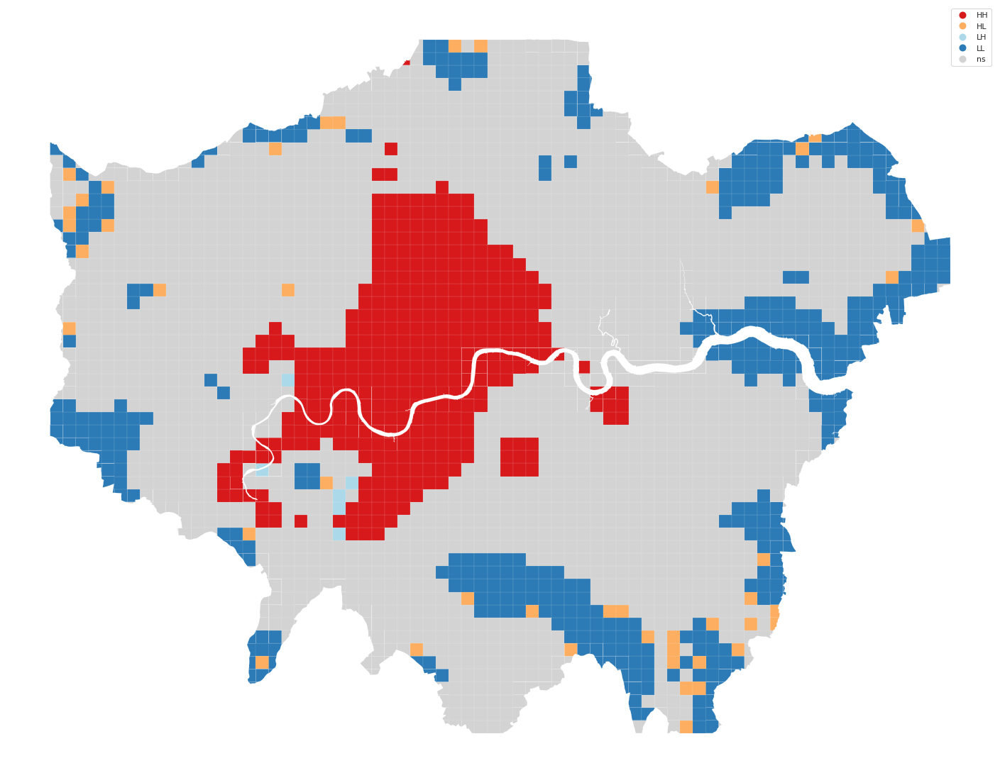

In [ ]:
lisa_cluster(moran_loc, grid_clip2, p=0.05, figsize = (25,20))
plt.show()

# EXPLORALTORY SPATIAL REGRESSION ANALYSIS

In [ ]:
!pip install pysal
!pip install contextily

  Using cached https://files.pythonhosted.org/packages/09/c6/d3e3abe5b4f4f16cf0dfc9240ab7ce10c2baa0e268989a4e3ec19e90c84e/urllib3-1.26.4-py2.py3-none-any.whl
ERROR: requests 2.23.0 has requirement urllib3!=1.25.0,!=1.25.1,<1.26,>=1.21.1, but you'll have urllib3 1.26.4 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: urllib3 1.25.11
    Uninstalling urllib3-1.25.11:
      Successfully uninstalled urllib3-1.25.11
  Using cached https://files.pythonhosted.org/packages/56/aa/4ef5aa67a9a62505db124a5cb5262332d1d4153462eb8fd89c9fa41e5d92/urllib3-1.25.11-py2.py3-none-any.whl
ERROR: pysal 2.4.0 has requirement urllib3>=1.26, but you'll have urllib3 1.25.11 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
  Found existing installation: urllib3 1.26.4
    Uninstalling urllib3-1.26.4:
      Successfully 

In [ ]:
# Import required packages
import matplotlib as mpl
from matplotlib import colors

%matplotlib inline
mpl.rcParams['figure.figsize'] = (15, 10) #this increases the inline figure size to 15 tall x 10 wide

import seaborn
import pandas as pd
import geopandas as gpd
import pysal
import numpy as np
import mapclassify
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore') # Change settings so that warnings are not displayed

import contextily as cx
from shapely.geometry import Polygon
import plotly.express as px
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import plot_moran
from splot.esda import moran_scatterplot
from splot.esda import plot_local_autocorrelation
from splot.esda import lisa_cluster
from esda.moran import Moran_Local

# Loading a few new packages
from scipy import stats
from pysal.model import spreg
import statsmodels.formula.api as sm

In [ ]:
hp = gpd.read_file('data_opens_3.geojson') #2011 housing points with some additional factors calculated
oa = gpd.read_file('OutputAreas.geojson')
KM0 = gpd.read_file('KM_Zero.geojson')
#lb = gpd.read_file('london_boroughs.geojson')

In [ ]:
hp['Detached'] = np.where(hp['propertytype']=='D', 1, 0)
hp['Flats'] = np.where(hp['propertytype']=='F', 1, 0)
hp['New'] = np.where(hp['oldnew']=='Y', 1, 0)

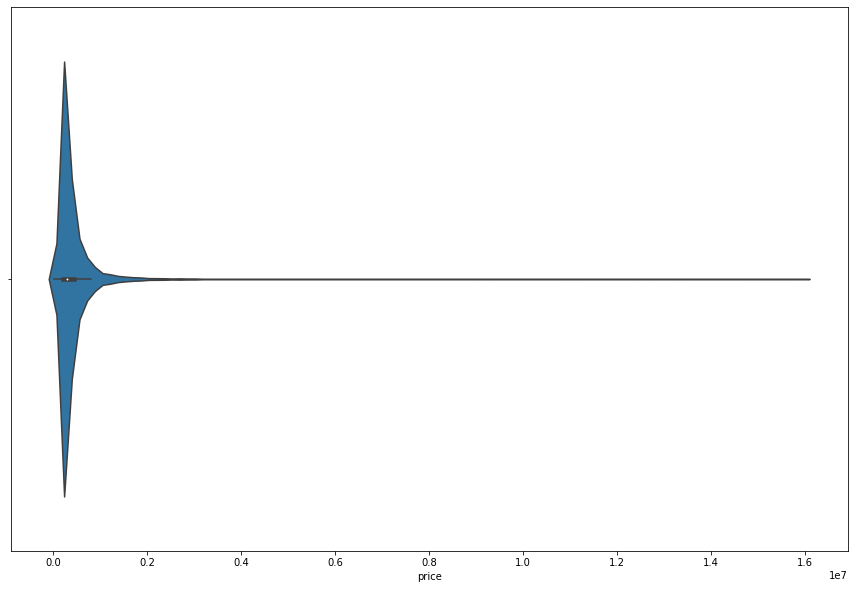

In [ ]:
bx = seaborn.violinplot(x=hp["price"])

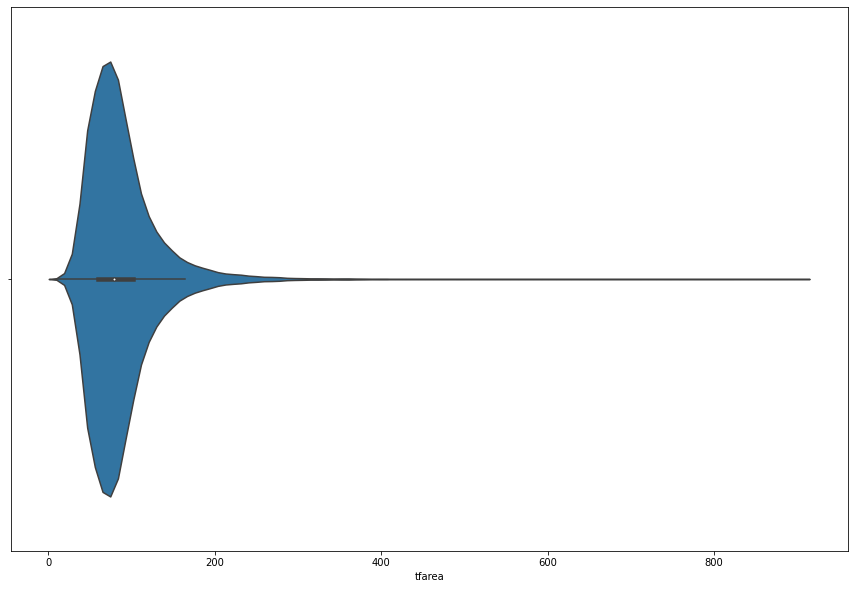

In [ ]:
bx = seaborn.violinplot(x=(hp["tfarea"]))

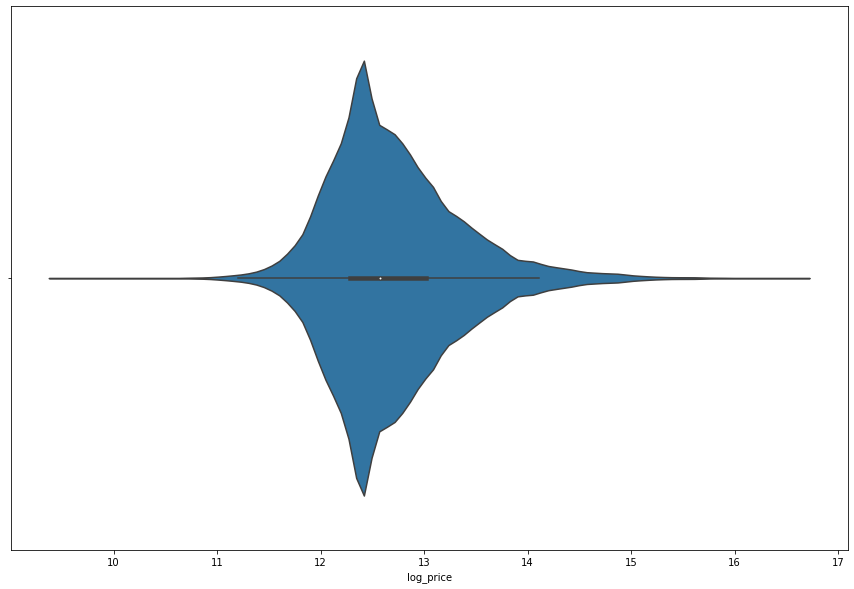

In [ ]:
hp['log_area'] = np.log(hp['tfarea'])
hp['log_price'] = np.log(hp['price'])
bx = seaborn.violinplot(x=hp["log_price"])

In [ ]:
variable_names = ['log_area', 'numberrooms', 'Flats', 'Detached','New']

In [ ]:
m1 = spreg.OLS(hp[['log_price']].values, hp[variable_names].values,
                name_y='log_price', name_x=variable_names, robust='white')
print(m1.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :           6
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71727
R-squared           :      0.4677
Adjusted R-squared  :      0.4677
Sum squared residual:   15458.531                F-statistic           :  12606.6256
Sigma-square        :       0.216                Prob(F-statistic)     :           0
S.E. of regression  :       0.464                Log likelihood        :  -46737.177
Sigma-square ML     :       0.216                Akaike info criterion :   93486.354
S.E of regression ML:      0.4642                Schwarz criterion     :   93541.438

White Standard Errors
-------------------------------------------------------

In [ ]:
np.exp(0.0379068) - 1

0.03863442763878777

In [ ]:
np.exp(0.2669421) - 1

0.30596482877796105

In [ ]:
(1.1)**1.0176671 - 1 # We expect a 3.3% increase in housing price when housing size increases by 10%

0.10185380025229418

In [ ]:
1.0176671/0.0094878

107.26059782035878

In [ ]:
hp2 = gpd.sjoin(hp,oa)
pd.set_option('display.max_columns', None)
hp2.head()

,index,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,ID,Dist_Road,Dist_Transit,Dist_OpenSpace,geometry,Detached,Flats,New,log_area,log_price,index_right,geo_code,label,NAME_2,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens
0,2,CR53EZ,1000000.0,2011-12-22,D,Y,F,A,A,2011.0,302.00,9.0,3311.258278,CR5 3EZ,CR5 3EZ,201107.0,NaN,3,310.9087078390314,1273.505462,531.854940,POINT (528925.000 157964.000),1,0,1,5.710427,13.815511,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849
14373,132454,CR53ED,950000.0,2011-11-29,D,N,F,A,A,2011.0,264.75,10.0,3588.290840,CR5 3ED,CR5 3ED,199007.0,NaN,132455,391.9983923256881,1183.977889,559.912286,POINT (528806.000 157882.000),1,0,0,5.578786,13.764217,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849
14441,133134,CR53ER,555000.0,2011-01-20,D,N,F,A,A,2011.0,185.00,7.0,3000.000000,CR5 3ER,CR5 3ER,199308.0,NaN,133135,42.01314846845171,1483.402493,649.963477,POINT (529126.000 157740.000),1,0,0,5.220356,13.226723,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849
14944,138724,CR53EH,495000.0,2011-11-17,D,N,F,A,A,2011.0,191.19,8.0,2589.047544,CR5 3EH,CR5 3EH,199007.0,NaN,138725,127.7245807778461,1327.320045,585.743002,POINT (529109.000 157935.000),1,0,0,5.253268,13.112313,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849
15030,139620,CR53QA,405000.0,2011-09-23,D,N,F,A,A,2011.0,63.96,5.0,6332.082552,CR5 3QA,CR5 3QA,199007.0,NaN,139621,247.9782101753372,1288.842874,525.809125,POINT (529024.000 158049.000),1,0,0,4.158258,12.911642,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849


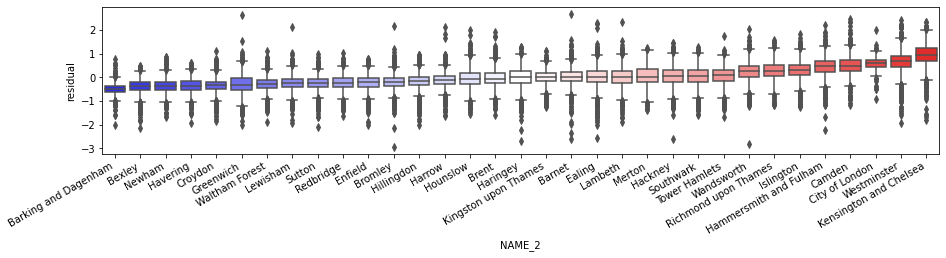

In [ ]:
hp2['residual'] = m1.u
medians = hp2.groupby("NAME_2").residual.median().to_frame('hood_residual')

f = plt.figure(figsize=(15,3))
ax = plt.gca()
seaborn.boxplot('NAME_2', 'residual', ax = ax,
                data=hp2.merge(medians, how='left',
                              left_on='NAME_2',
                              right_index=True)
                   .sort_values('hood_residual'), palette='bwr')
f.autofmt_xdate()
plt.show()

In [ ]:
w = weights.DistanceBand.from_dataframe(hp2, 500) # Weights based on features within 500 meters

In [ ]:
w.mean_neighbors

69.30570309341586

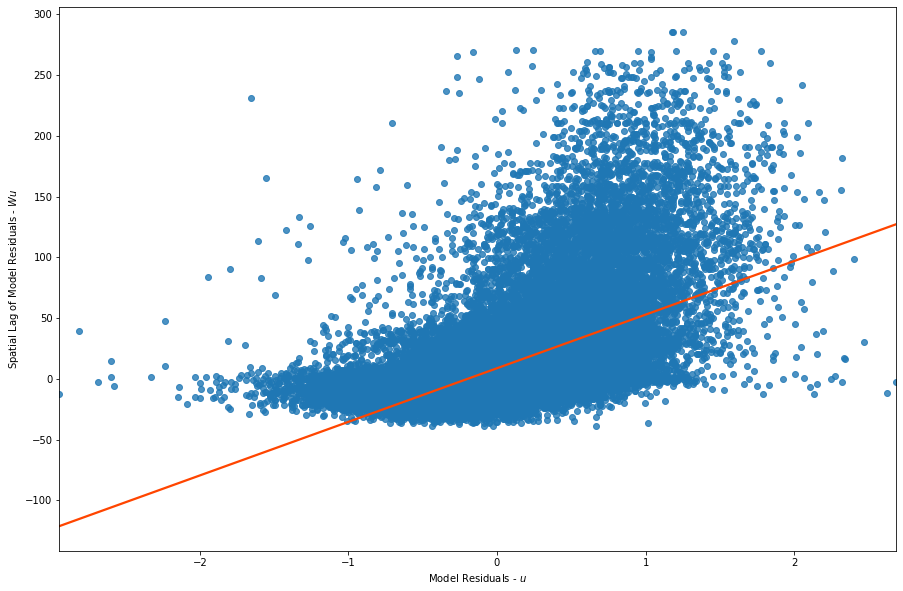

In [ ]:
lag_residual = weights.spatial_lag.lag_spatial(w, m1.u)
ax = seaborn.regplot(m1.u.flatten(), lag_residual.flatten(), 
                     line_kws=dict(color='orangered'),
                     ci=None)
ax.set_xlabel('Model Residuals - $u$')
ax.set_ylabel('Spatial Lag of Model Residuals - $W u$');

In [ ]:
outliers = esda.moran.Moran_Local(m1.u, w, permutations=999)
error_clusters = (outliers.q % 2 == 1) # only the cluster cores
error_clusters &= (outliers.p_sim <= .001) # filtering out non-significant clusters
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
hp2.assign(error_clusters = error_clusters,
          local_I = outliers.Is)\
  .query("error_clusters")\
  .sort_values('local_I')\
  .to_crs('EPSG:3857').plot('local_I', cmap='bwr', marker='.', ax=ax)
ax.set_title("Local Moran's I Hotpsots of Under- and Over-Prediction")
ax.set_axis_off() #Remove axes from plot 
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

ValueError: ignored

In [ ]:
f = 'log_price ~ ' + ' + '.join(variable_names) + ' + NAME_2 - 1' # Remove intercept (-1) in this fixed effects model
print(f)

log_price ~ log_area + numberrooms + Flats + Detached + New + NAME_2 - 1


In [ ]:
m2 = sm.ols(f, data=hp2).fit()
print(m2.summary2())

                        Results: Ordinary least squares
Model:                  OLS                  Adj. R-squared:         0.752     
Dependent Variable:     log_price            AIC:                    38196.3900
Date:                   2021-05-12 13:00     BIC:                    38544.9184
No. Observations:       71097                Log-Likelihood:         -19060.   
Df Model:               37                   F-statistic:            5828.     
Df Residuals:           71059                Prob (F-statistic):     0.00      
R-squared:              0.752                Scale:                  0.10014   
-------------------------------------------------------------------------------
                                Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-------------------------------------------------------------------------------
NAME_2[Barking and Dagenham]    8.5450   0.0210 406.6309 0.0000  8.5038  8.5862
NAME_2[Barnet]                  9.1532   0.0202 453.4906 0.0000 

In [ ]:
neighborhood_effects = m2.params.filter(like='NAME_2')
neighborhood_effects.head()

NAME_2[Barking and Dagenham]    8.545000
NAME_2[Barnet]                  9.153167
NAME_2[Bexley]                  8.653961
NAME_2[Brent]                   9.118544
NAME_2[Bromley]                 8.874468
dtype: float64

In [ ]:
stripped = neighborhood_effects.index.str.strip('NAME_2[').str.strip(']')
neighborhood_effects.index = stripped
neighborhood_effects = neighborhood_effects.to_frame('fixed_effect')
neighborhood_effects.head()

,fixed_effect
Barking and Dagenham,8.545000
Barnet,9.153167
Bexley,8.653961
Brent,9.118544
Bromley,8.874468


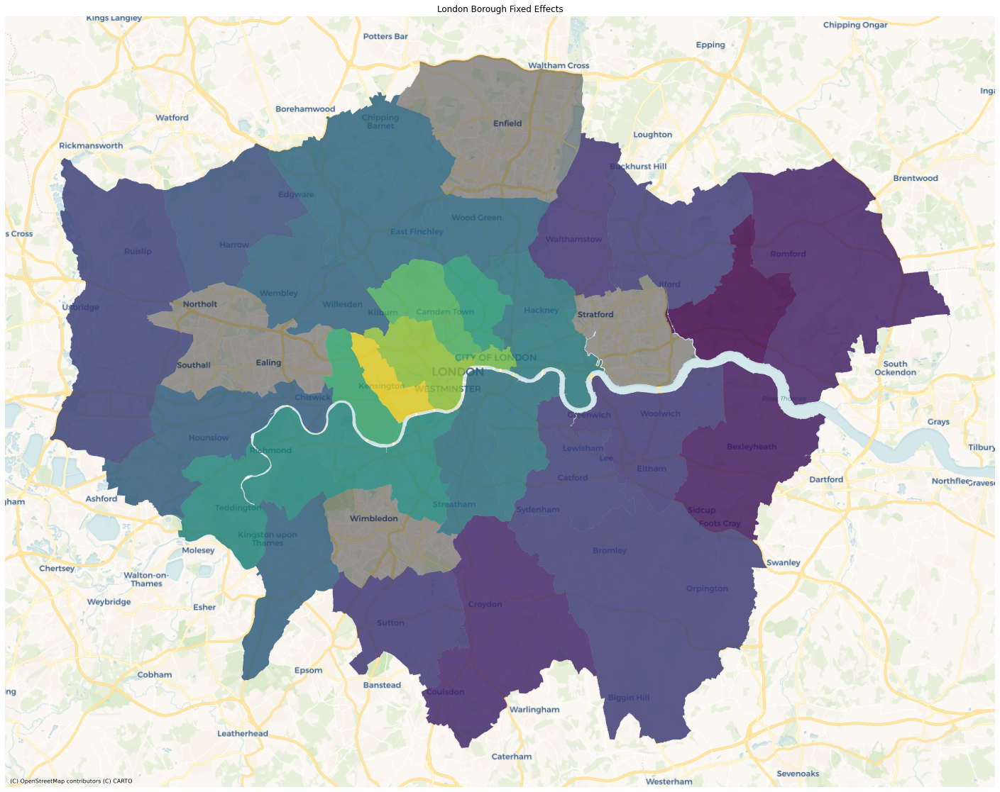

In [ ]:
neighborhood_effects['NAME'] = neighborhood_effects.index
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
lb.to_crs('EPSG:3857').plot(ax=ax, color='k', alpha=0.4)
lb.merge(neighborhood_effects, how='left',
                    left_on='NAME', 
                    right_on='NAME')\
                  .dropna(subset=['fixed_effect'])\
                  .to_crs('EPSG:3857').plot('fixed_effect',
                        ax=ax, alpha=.7)
ax.set_title("London Borough Fixed Effects")
ax.set_axis_off() #Remove axes from plot 
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

In [ ]:
hp_0km = hp2.geometry.apply(lambda x: KM0.distance(x).min()) #KM0 = the central point of London near Trafalgar square
hp_0km.head()

0        22442.160157
14373    22530.237359
14441    22656.936031
14944    22462.788624
15030    22352.568686
Name: geometry, dtype: float64

In [ ]:
hp_0km_2 = pd.merge(hp2, hp_0km, left_index=True, right_index=True)
hp_0km_3 = hp_0km_2.rename(index=str, columns={"geometry_y":"Dist_0KM", "geometry_x":"geometry"})
hp_0km_3.head()

,index,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,ID,Dist_Road,Dist_Transit,Dist_OpenSpace,geometry,Detached,Flats,New,log_area,log_price,index_right,geo_code,label,NAME_2,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens,residual,Dist_0KM
0,2,CR53EZ,1000000.0,2011-12-22,D,Y,F,A,A,2011.0,302.00,9.0,3311.258278,CR5 3EZ,CR5 3EZ,201107.0,NaN,3,310.9087078390314,1273.505462,531.854940,POINT (528925.000 157964.000),1,0,1,5.710427,13.815511,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,-0.460929,22442.160157
14373,132454,CR53ED,950000.0,2011-11-29,D,N,F,A,A,2011.0,264.75,10.0,3588.290840,CR5 3ED,CR5 3ED,199007.0,NaN,132455,391.9983923256881,1183.977889,559.912286,POINT (528806.000 157882.000),1,0,0,5.578786,13.764217,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,0.706921,22530.237359
14441,133134,CR53ER,555000.0,2011-01-20,D,N,F,A,A,2011.0,185.00,7.0,3000.000000,CR5 3ER,CR5 3ER,199308.0,NaN,133135,42.01314846845171,1483.402493,649.963477,POINT (529126.000 157740.000),1,0,0,5.220356,13.226723,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,0.682601,22656.936031
14944,138724,CR53EH,495000.0,2011-11-17,D,N,F,A,A,2011.0,191.19,8.0,2589.047544,CR5 3EH,CR5 3EH,199007.0,NaN,138725,127.7245807778461,1327.320045,585.743002,POINT (529109.000 157935.000),1,0,0,5.253268,13.112313,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,0.391566,22462.788624
15030,139620,CR53QA,405000.0,2011-09-23,D,N,F,A,A,2011.0,63.96,5.0,6332.082552,CR5 3QA,CR5 3QA,199007.0,NaN,139621,247.9782101753372,1288.842874,525.809125,POINT (529024.000 158049.000),1,0,0,4.158258,12.911642,19031,E00005097,E92000001E09000008E00005097,Croydon,399.0,6.621308,133.0,60.26,0.37594,197,0.062914,0.127451,21.0,0.34849,0.568339,22352.568686


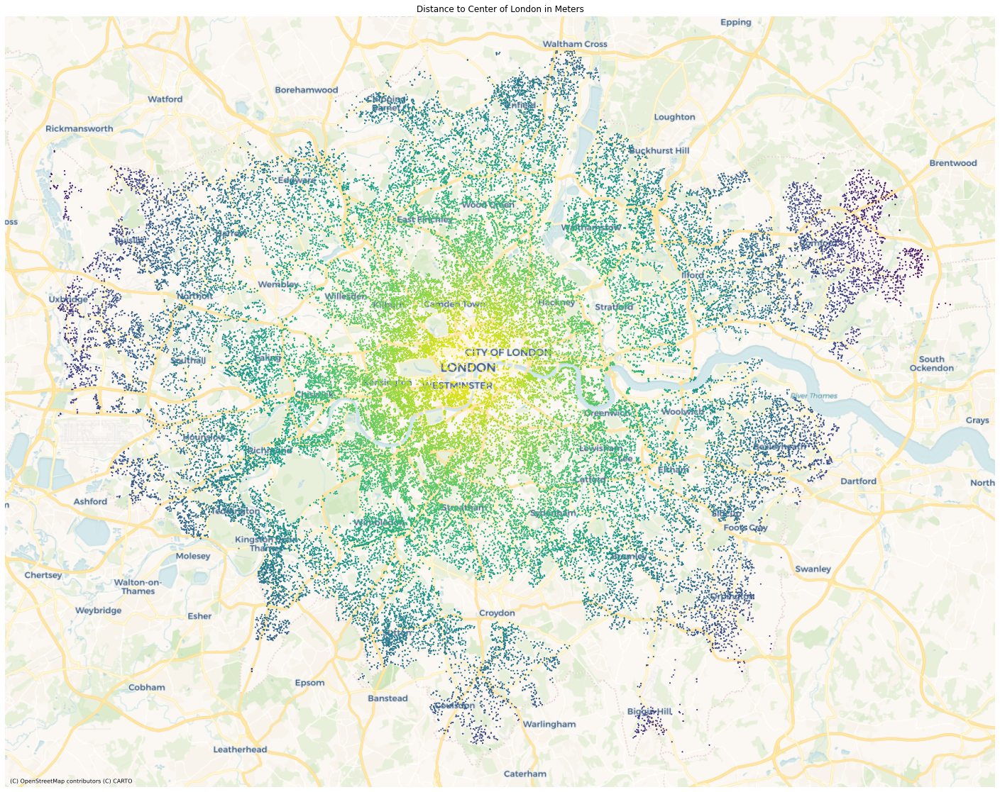

In [ ]:
color_map = plt.cm.get_cmap('viridis')
reversed_color_map = color_map.reversed()
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
hp_0km_3.to_crs('EPSG:3857').plot('Dist_0KM', cmap=reversed_color_map, marker='.', s=5, ax=ax)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('Distance to Center of London in Meters') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

In [ ]:
base_names = variable_names
dist_names = variable_names + ['Dist_0KM']

In [ ]:
m3 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[dist_names].values,
                name_y='log_price', name_x=dist_names, robust='white')
print(m3.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :           7
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71726
R-squared           :      0.6352
Adjusted R-squared  :      0.6352
Sum squared residual:   10594.944                F-statistic           :  20815.4576
Sigma-square        :       0.148                Prob(F-statistic)     :           0
S.E. of regression  :       0.384                Log likelihood        :  -33187.383
Sigma-square ML     :       0.148                Akaike info criterion :   66388.765
S.E of regression ML:      0.3843                Schwarz criterion     :   66453.030

White Standard Errors
-------------------------------------------------------

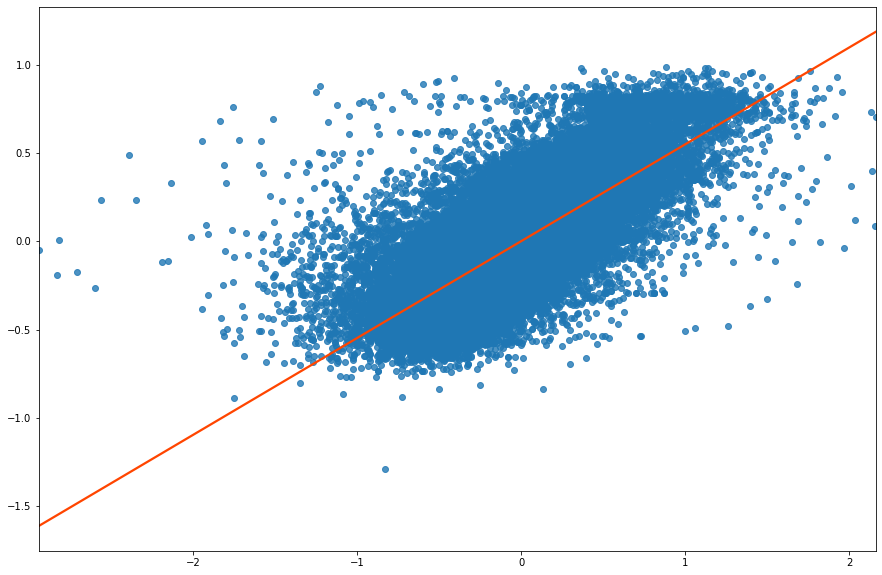

In [ ]:
lag_residual = weights.spatial_lag.lag_spatial(w, m3.u)
seaborn.regplot(m3.u.flatten(), lag_residual.flatten(), 
                line_kws=dict(color='orangered'),
                ci=None);

In [ ]:
hp_0km_3["Dist_Road"] = pd.to_numeric(hp_0km_3["Dist_Road"])
all_names = dist_names + ["Dist_Road"] + ['Dist_Transit'] + ['Dist_OpenSpace'] + ['DEPRHH']
all_names

['log_area',
 'numberrooms',
 'Flats',
 'Detached',
 'New',
 'Dist_0KM',
 'Dist_Road',
 'Dist_Transit',
 'Dist_OpenSpace',
 'DEPRHH']

In [ ]:
m4 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white')
print(m4.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          11
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71722
R-squared           :      0.7109
Adjusted R-squared  :      0.7108
Sum squared residual:    8397.437                F-statistic           :  17633.5631
Sigma-square        :       0.117                Prob(F-statistic)     :           0
S.E. of regression  :       0.342                Log likelihood        :  -24850.203
Sigma-square ML     :       0.117                Akaike info criterion :   49722.406
S.E of regression ML:      0.3421                Schwarz criterion     :   49823.394

White Standard Errors
-------------------------------------------------------

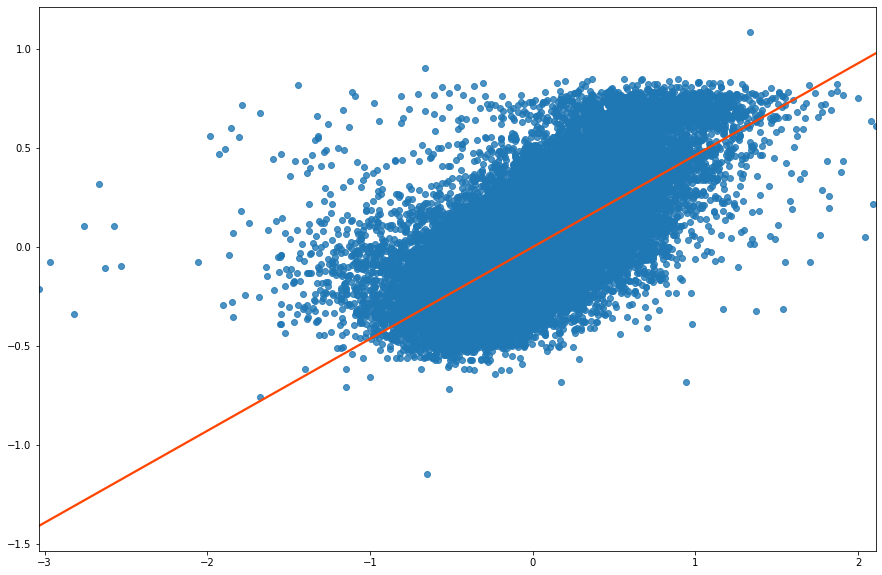

In [ ]:
lag_residual = weights.spatial_lag.lag_spatial(w, m4.u)
seaborn.regplot(m4.u.flatten(), lag_residual.flatten(), 
                line_kws=dict(color='orangered'),
                ci=None);

In [ ]:
m4 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white', w=w, spat_diag=True, moran=True)
print(m4.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          11
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71722
R-squared           :      0.7109
Adjusted R-squared  :      0.7108
Sum squared residual:    8397.437                F-statistic           :  17633.5631
Sigma-square        :       0.117                Prob(F-statistic)     :           0
S.E. of regression  :       0.342                Log likelihood        :  -24850.203
Sigma-square ML     :       0.117                Akaike info criterion :   49722.406
S.E of regression ML:      0.3421                Schwarz criterion     :   49823.394

White Standard Errors
-------------------------------------------------------

In [ ]:
m5 = spreg.GM_Lag(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                     w=w, name_y='log_price', name_x=all_names, robust='white')
print(m5.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          12
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71721
Pseudo R-squared    :      0.7494
Spatial Pseudo R-squared:  0.7097

White Standard Errors
------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT       8.5911231       0.2543710      33.7739903       0.0000000
            log_area       0.7029243       0.0074674      94.1329272       0.0000000
         numberrooms       0.0387978 

In [ ]:
m6 = spreg.GM_Error_Het(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                     w=w, name_y='log_price', name_x=all_names)
print(m6.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES (HET)
---------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          11
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71722
Pseudo R-squared    :      0.6853
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT      10.8559759       0.0348413     311.5832106       0.0000000
            log_area       0.6151473       0.0055467     110.9028092       0.00

In [ ]:
m7 = spreg.GM_Combo_Het(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                     w=w, name_y='log_price', name_x=all_names)
print(m7.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED TWO STAGE LEAST SQUARES (HET)
-------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       71733
Mean dependent var  :     12.6945                Number of Variables   :          12
S.D. dependent var  :      0.6363                Degrees of Freedom    :       71721
Pseudo R-squared    :      0.6887
Spatial Pseudo R-squared:  0.6870
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT      10.7783242       0.1080110      99.7891714       0.0000000
            log_area     

In [ ]:
hpcam = hp_0km_3[(hp_0km_3["NAME_2"]=="Camden")]
wcam = weights.DistanceBand.from_dataframe(hpcam, 500)
m7cam = spreg.GM_Error_Het(hpcam[['log_price']].values, hpcam[all_names].values,
                     w=wcam, name_y='log_price', name_x=all_names)
print(m7cam.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES (HET)
---------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:        1931
Mean dependent var  :     13.1789                Number of Variables   :          11
S.D. dependent var  :      0.6899                Degrees of Freedom    :        1920
Pseudo R-squared    :      0.7929
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT      10.7799765       0.1438969      74.9145700       0.0000000
            log_area       0.7418012       0.0325661      22.7783517       0.00

In [ ]:
hpbd = hp_0km_3[(hp_0km_3["NAME_2"]=="Barking and Dagenham")]
wbd = weights.DistanceBand.from_dataframe(hpbd, 500)
m7bd = spreg.GM_Error_Het(hpbd[['log_price']].values, hpbd[all_names].values,
                     w=wbd, name_y='log_price', name_x=all_names)
print(m7bd.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED LEAST SQUARES (HET)
---------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:        1177
Mean dependent var  :     12.0572                Number of Variables   :          11
S.D. dependent var  :      0.2821                Degrees of Freedom    :        1166
Pseudo R-squared    :      0.6639
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT      10.8200951       0.1710892      63.2424348       0.0000000
            log_area       0.3446404       0.0293121      11.7576290       0.00

# Duration, Terrace Type House and Distance 1km Hypothesis for 2014 Dataset

In [ ]:
hp = gpd.read_file('data_all_2014.geojson') #2011 housing points with some additional factors calculated
oa = gpd.read_file('OutputAreas.geojson')
KM0 = gpd.read_file('KM_Zero.geojson')
lb = gpd.read_file('london_boroughs.geojson')

In [ ]:
hp['duration'].unique()

array(['L', 'F'], dtype=object)

In [ ]:
hp['Detached'] = np.where(hp['propertytype']=='D', 1, 0)
hp['Terrace'] = np.where(hp['propertytype']=='T', 1, 0)
hp['New'] = np.where(hp['oldnew']=='Y', 1, 0)

In [ ]:
hp['Freehold']=np.where(hp['duration']=='F',1,0)

In [ ]:
hp['log_area'] = np.log(hp['tfarea'])
hp['log_price'] = np.log(hp['price'])

In [ ]:
variable_names = ['log_area', 'numberrooms', 'Terrace', 'Detached','New','Freehold']

In [ ]:
m1 = spreg.OLS(hp[['log_price']].values, hp[variable_names].values,
                name_y='log_price', name_x=variable_names, robust='white')
print(m1.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       90686
Mean dependent var  :     12.8852                Number of Variables   :           7
S.D. dependent var  :      0.6458                Degrees of Freedom    :       90679
R-squared           :      0.4718
Adjusted R-squared  :      0.4718
Sum squared residual:   19976.357                F-statistic           :  13500.4929
Sigma-square        :       0.220                Prob(F-statistic)     :           0
S.E. of regression  :       0.469                Log likelihood        :  -60080.541
Sigma-square ML     :       0.220                Akaike info criterion :  120175.082
S.E of regression ML:      0.4693                Schwarz criterion     :  120240.988

White Standard Errors
-------------------------------------------------------

In [ ]:
print(np.exp(0.0435413)-1)
np.exp(-0.2961625)-1

0.04450313140056594


-0.2563334276170872

In [ ]:
hp2 = gpd.sjoin(hp,oa)
pd.set_option('display.max_columns', None)
hp2.head()

,index,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,Dist_Road,Dist_Transit,Dist_OpenSpace,geometry,Detached,Terrace,New,Freehold,log_area,log_price,index_right,geo_code,label,NAME_2,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens
0,17,EC2Y8DR,1727009.0,2014-10-03,F,N,L,A,A,2014.0,112.0,4.0,15419.723214,EC2Y8DR,EC2Y 8DR,198001.0,NaN,756.999993,260.948978,6.214753,POINT (532271.000 181868.000),0,0,0,0,4.718499,14.361902,12137,E00000001,E92000001E41000324E00000001,City of London,194.0,289.552200,99.0,0.67,0.313131,100,0.054054,0.284314,3.0,4.477612
1,19,EC3A5AY,625000.0,2014-07-30,F,N,L,A,A,2014.0,47.0,2.0,13297.872340,EC3A5AY,EC3A 5AY,198001.0,NaN,356.974725,227.818441,6.869067,POINT (533405.000 181163.000),0,0,0,0,3.850148,13.345507,12123,E00000035,E92000001E41000324E00000035,City of London,227.0,6.692217,150.0,33.92,0.533333,187,0.054795,0.242105,180.0,5.306604
14,105,EC3R8BT,610700.0,2014-06-30,F,N,L,A,A,2014.0,48.0,2.0,12722.916667,EC3R8BT,EC3R 8BT,198001.0,NaN,754.149175,135.671399,39.289812,POINT (533009.000 180722.000),0,0,0,0,3.871201,13.322361,12123,E00000035,E92000001E41000324E00000035,City of London,227.0,6.692217,150.0,33.92,0.533333,187,0.054795,0.242105,180.0,5.306604
15,106,EC3R8EB,775000.0,2014-08-29,F,Y,L,A,A,2014.0,58.0,2.0,13362.068966,EC3R8EB,EC3R 8EB,198510.0,NaN,707.392381,164.774592,30.239869,POINT (533059.000 180745.000),0,0,1,0,4.060443,13.560618,12123,E00000035,E92000001E41000324E00000035,City of London,227.0,6.692217,150.0,33.92,0.533333,187,0.054795,0.242105,180.0,5.306604
17,114,EC3R8BT,680000.0,2014-08-12,F,N,L,A,A,2014.0,75.0,3.0,9066.666667,EC3R8BT,EC3R 8BT,198001.0,NaN,754.149175,135.671399,39.289812,POINT (533009.000 180722.000),0,0,0,0,4.317488,13.429848,12123,E00000035,E92000001E41000324E00000035,City of London,227.0,6.692217,150.0,33.92,0.533333,187,0.054795,0.242105,180.0,5.306604


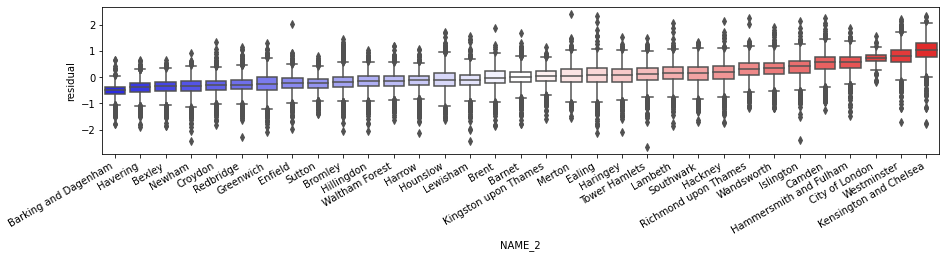

In [ ]:
hp2['residual'] = m1.u
medians = hp2.groupby("NAME_2").residual.median().to_frame('hood_residual')

f = plt.figure(figsize=(15,3))
ax = plt.gca()
seaborn.boxplot('NAME_2', 'residual', ax = ax,
                data=hp2.merge(medians, how='left',
                              left_on='NAME_2',
                              right_index=True)
                   .sort_values('hood_residual'), palette='bwr')
f.autofmt_xdate()
plt.show()

In [ ]:
w = weights.DistanceBand.from_dataframe(hp2, 1000) # Weights based on features within 1000 meters

In [ ]:
f = 'log_price ~ ' + ' + '.join(variable_names) + ' + NAME_2 - 1' # Remove intercept (-1) in this fixed effects model
print(f)

log_price ~ log_area + numberrooms + Terrace + Detached + New + Freehold + NAME_2 - 1


In [ ]:
m2 = sm.ols(f, data=hp2).fit()
print(m2.summary2())

                        Results: Ordinary least squares
Model:                  OLS                  Adj. R-squared:         0.768     
Dependent Variable:     log_price            AIC:                    45095.1559
Date:                   2021-05-13 20:02     BIC:                    45461.9611
No. Observations:       89793                Log-Likelihood:         -22509.   
Df Model:               38                   F-statistic:            7812.     
Df Residuals:           89754                Prob (F-statistic):     0.00      
R-squared:              0.768                Scale:                  0.096704  
-------------------------------------------------------------------------------
                                Coef.  Std.Err.    t     P>|t|   [0.025  0.975]
-------------------------------------------------------------------------------
NAME_2[Barking and Dagenham]    8.5870   0.0177 484.0900 0.0000  8.5523  8.6218
NAME_2[Barnet]                  9.1852   0.0172 532.8786 0.0000 

In [ ]:
#most people would not prefer terrace at 1% significance level but if we keep 5% siginificance level then whether house is terrace or detached, it doesn't matter
#and they would prefer FREEHOLD rather than LEASEHOLD

In [ ]:
np.exp(0.1137)-1

0.12041594967549041

1

In [ ]:
neighborhood_effects = m2.params.filter(like='NAME_2')
neighborhood_effects.head()

NAME_2[Barking and Dagenham]    8.587040
NAME_2[Barnet]                  9.185197
NAME_2[Bexley]                  8.700702
NAME_2[Brent]                   9.210240
NAME_2[Bromley]                 8.938562
dtype: float64

In [ ]:
stripped = neighborhood_effects.index.str.strip('NAME_2[').str.strip(']')
neighborhood_effects.index = stripped
neighborhood_effects = neighborhood_effects.to_frame('fixed_effect')
neighborhood_effects.head()

,fixed_effect
Barking and Dagenham,8.587040
Barnet,9.185197
Bexley,8.700702
Brent,9.210240
Bromley,8.938562


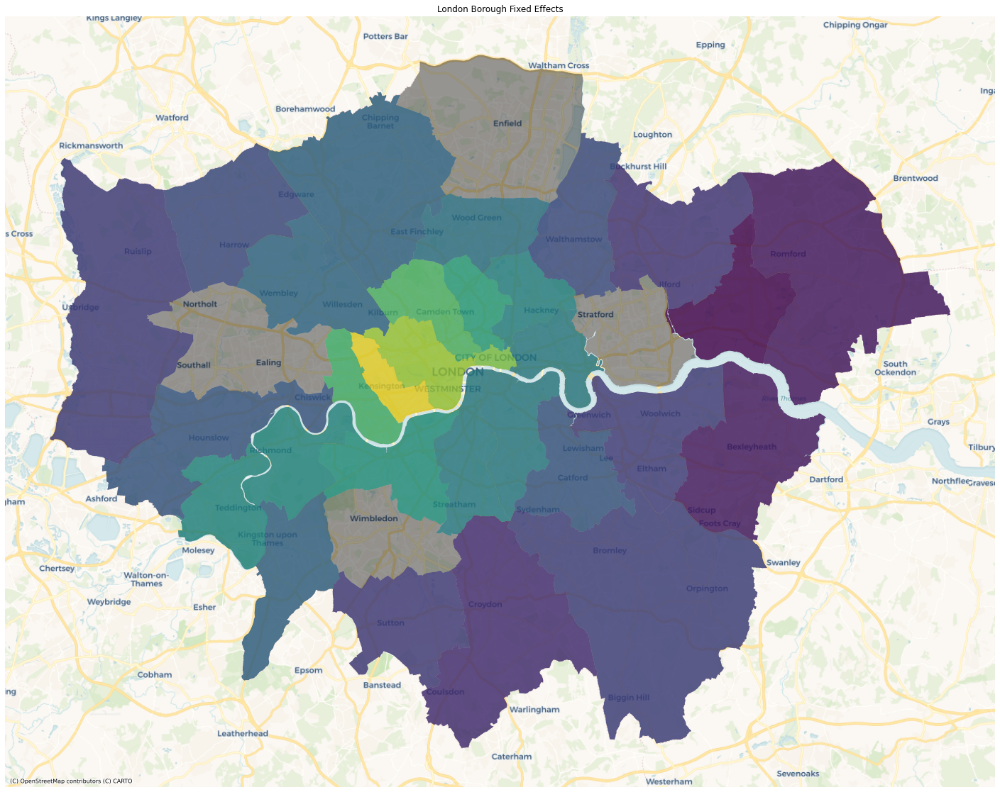

In [ ]:
neighborhood_effects['NAME'] = neighborhood_effects.index
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
lb.to_crs('EPSG:3857').plot(ax=ax, color='k', alpha=0.4)
lb.merge(neighborhood_effects, how='left',
                    left_on='NAME', 
                    right_on='NAME')\
                  .dropna(subset=['fixed_effect'])\
                  .to_crs('EPSG:3857').plot('fixed_effect',
                        ax=ax, alpha=.7)
ax.set_title("London Borough Fixed Effects")
ax.set_axis_off() #Remove axes from plot 
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

In [ ]:
hp_0km = hp2.geometry.apply(lambda x: KM0.distance(x).min()) #KM0 = the central point of London near Trafalgar square
hp_0km.head()

0     2686.694595
1     3460.195917
14    2993.885554
15    3046.241176
17    2993.885554
Name: geometry, dtype: float64

In [ ]:
hp_0km_2 = pd.merge(hp2, hp_0km, left_index=True, right_index=True)
hp_0km_3 = hp_0km_2.rename(index=str, columns={"geometry_y":"Dist_0KM", "geometry_x":"geometry"})
#hp_0km_3.head()

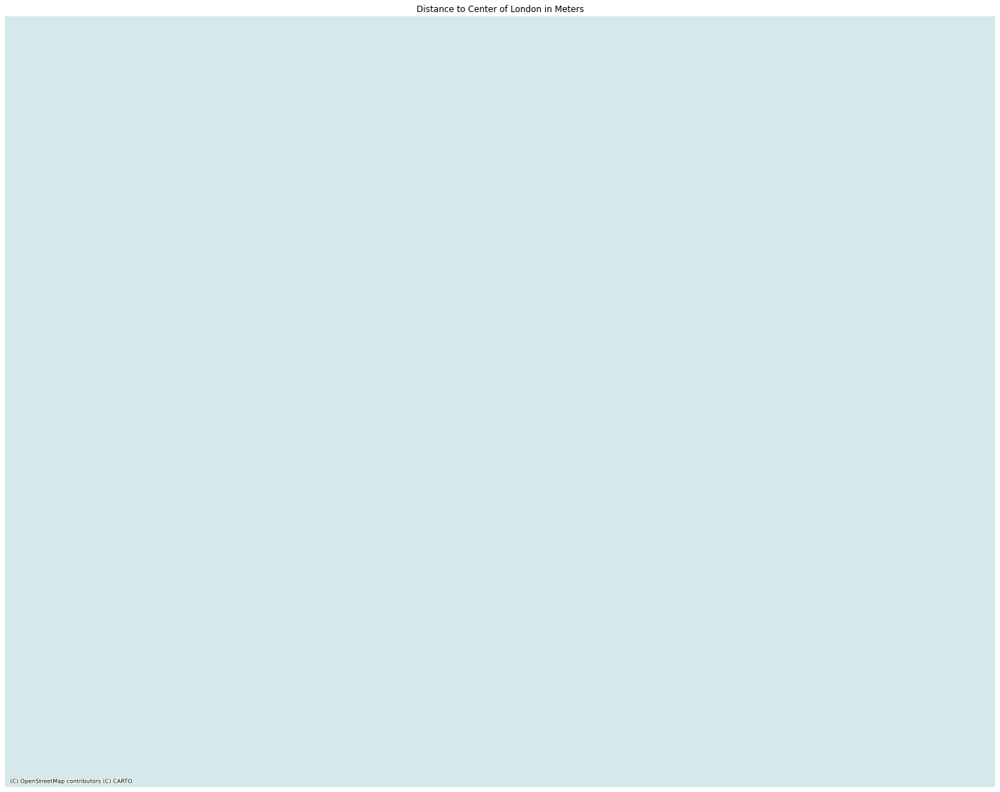

In [ ]:
color_map = plt.cm.get_cmap('viridis')
reversed_color_map = color_map.reversed()
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
hp_0km_3.to_crs('EPSG:3857').plot('Dist_0KM', cmap=reversed_color_map, marker='.', s=5, ax=ax)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('Distance to Center of London in Meters') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

In [ ]:
base_names = variable_names
dist_names = variable_names + ['Dist_0KM']

In [ ]:
m3 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[dist_names].values,
                name_y='log_price', name_x=dist_names, robust='white')
print(m3.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       90686
Mean dependent var  :     12.8852                Number of Variables   :           8
S.D. dependent var  :      0.6458                Degrees of Freedom    :       90678
R-squared           :      0.6768
Adjusted R-squared  :      0.6768
Sum squared residual:   12222.685                F-statistic           :  27130.0410
Sigma-square        :       0.135                Prob(F-statistic)     :           0
S.E. of regression  :       0.367                Log likelihood        :  -37805.530
Sigma-square ML     :       0.135                Akaike info criterion :   75627.061
S.E of regression ML:      0.3671                Schwarz criterion     :   75702.382

White Standard Errors
-------------------------------------------------------

In [ ]:
#we see that terrace and freehold property is significant

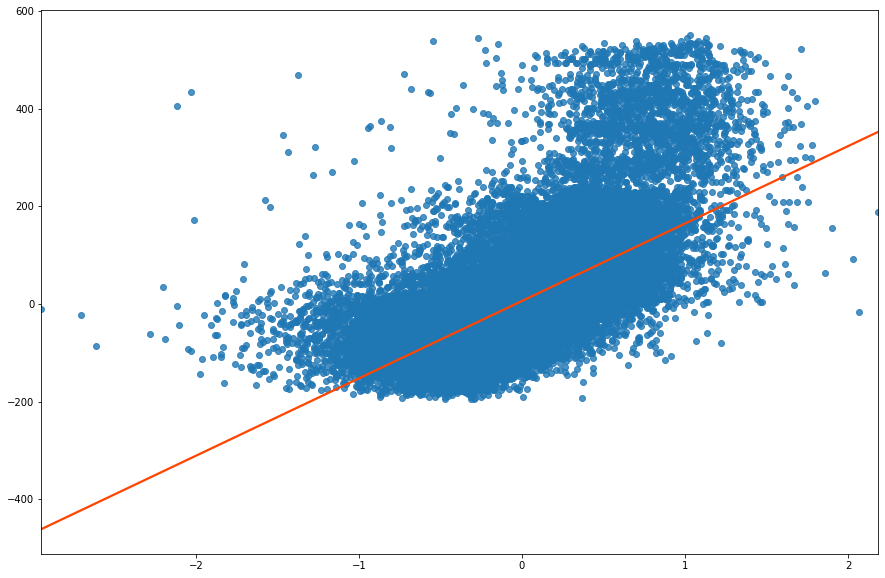

In [ ]:
lag_residual = weights.spatial_lag.lag_spatial(w, m3.u)
seaborn.regplot(m3.u.flatten(), lag_residual.flatten(), 
                line_kws=dict(color='orangered'),
                ci=None);

In [ ]:
hp_0km_3["Dist_Road"] = pd.to_numeric(hp_0km_3["Dist_Road"])
all_names = dist_names + ["Dist_Road"] + ['Dist_Transit'] + ['Dist_OpenSpace'] + ['DEPRHH']
all_names

['log_area',
 'numberrooms',
 'Terrace',
 'Detached',
 'New',
 'Freehold',
 'Dist_0KM',
 'Dist_Road',
 'Dist_Transit',
 'Dist_OpenSpace',
 'DEPRHH']

In [ ]:
hp_0km_3['year'].unique()

array([2014.])

In [ ]:
m4 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white')
print(m4.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       90686
Mean dependent var  :     12.8852                Number of Variables   :          12
S.D. dependent var  :      0.6458                Degrees of Freedom    :       90674
R-squared           :      0.7502
Adjusted R-squared  :      0.7502
Sum squared residual:    9445.978                F-statistic           :  24761.7293
Sigma-square        :       0.104                Prob(F-statistic)     :           0
S.E. of regression  :       0.323                Log likelihood        :  -26120.432
Sigma-square ML     :       0.104                Akaike info criterion :   52264.863
S.E of regression ML:      0.3227                Schwarz criterion     :   52377.845

White Standard Errors
-------------------------------------------------------

# Spatial Specific models

In [ ]:
m4 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white', w=w, spat_diag=True, moran=True)
print(m4.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       90686
Mean dependent var  :     12.8852                Number of Variables   :          12
S.D. dependent var  :      0.6458                Degrees of Freedom    :       90674
R-squared           :      0.7502
Adjusted R-squared  :      0.7502
Sum squared residual:    9445.978                F-statistic           :  24761.7293
Sigma-square        :       0.104                Prob(F-statistic)     :           0
S.E. of regression  :       0.323                Log likelihood        :  -26120.432
Sigma-square ML     :       0.104                Akaike info criterion :   52264.863
S.E of regression ML:      0.3227                Schwarz criterion     :   52377.845

White Standard Errors
-------------------------------------------------------

In [ ]:
#SPATIAL LAG + ERROR MODEL

In [ ]:
m7 = spreg.GM_Combo_Het(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                     w=w, name_y='log_price', name_x=all_names)
print(m7.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIALLY WEIGHTED TWO STAGE LEAST SQUARES (HET)
-------------------------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       90686
Mean dependent var  :     12.8852                Number of Variables   :          13
S.D. dependent var  :      0.6458                Degrees of Freedom    :       90673
Pseudo R-squared    :      0.7562
Spatial Pseudo R-squared:  0.7538
N. of iterations    :           1                Step1c computed       :          No

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT      10.6961671       0.0250959     426.2122280       0.0000000
            log_area     

In [ ]:
np.exp(0.2143707)-1

0.23908189732692886

In [ ]:
hpken = hp_0km_3[(hp_0km_3["NAME_2"]=="Kensington and Chelsea")]
wken = weights.DistanceBand.from_dataframe(hpken, 1000)
m7ken = spreg.GM_Lag(hpken[['log_price']].values, hpken[all_names].values,
                     w=wken, name_y='log_price', name_x=all_names)
print(m7ken.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:        1924
Mean dependent var  :     14.0955                Number of Variables   :          13
S.D. dependent var  :      0.8575                Degrees of Freedom    :        1911
Pseudo R-squared    :      0.8459
Spatial Pseudo R-squared:  0.8459

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT      10.5263314       0.1243705      84.6368807       0.0000000
            log_area       0.9979042       0.0258216      38.6461631       0.0000000
         numberrooms       0.0214124       0.0077845       

In [ ]:
hpsu = hp_0km_3[(hp_0km_3["NAME_2"]=="Sutton")]
wsu = weights.DistanceBand.from_dataframe(hpsu, 1000)
m7su = spreg.GM_Lag(hpsu[['log_price']].values, hpsu[all_names].values,
                     w=wsu, name_y='log_price', name_x=all_names)
print(m7su.summary)

REGRESSION
----------
SUMMARY OF OUTPUT: SPATIAL TWO STAGE LEAST SQUARES
--------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:        2933
Mean dependent var  :     12.5974                Number of Variables   :          13
S.D. dependent var  :      0.4287                Degrees of Freedom    :        2920
Pseudo R-squared    :      0.8587
Spatial Pseudo R-squared:  0.8587

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT      10.2382207       0.0777753     131.6383796       0.0000000
            log_area       0.4443665       0.0166108      26.7516228       0.0000000
         numberrooms       0.0463540       0.0042330      1